In [ ]:
pip install scanpy scvi-tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.2/380.2 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.1/122.1 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.2/330.2 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 745.2/745.2 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━

In [ ]:
pip install --user scikit-misc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 22.5 MB/s eta 0:00:00


In [ ]:
pip install harmonypy

In [ ]:
import scanpy as sc
import scvi

sc.set_figure_params(figsize=(10, 10))
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

# Downloading Data

In [ ]:
import tempfile
import os

save_dir = tempfile.TemporaryDirectory()
pancreas_adata_path = os.path.join(save_dir.name, "pancreas.h5ad")

adata = sc.read(
    pancreas_adata_path,
    backup_url="https://figshare.com/ndownloader/files/24539828",
)
adata

  0%|          | 0.00/301M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 16382 × 19093
    obs: 'tech', 'celltype', 'size_factors'
    layers: 'counts'

# Preprocessing

In [ ]:
scvi.model.SCVI.setup_anndata(
      adata,
      layer="counts",
      categorical_covariate_keys=["tech"],
  )
model = scvi.model.SCVI(adata)
model

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [ ]:
sc.pp.filter_genes(adata, min_counts=3)
adata.layers["counts"] = adata.X.copy()  # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # freeze the state in `.raw`

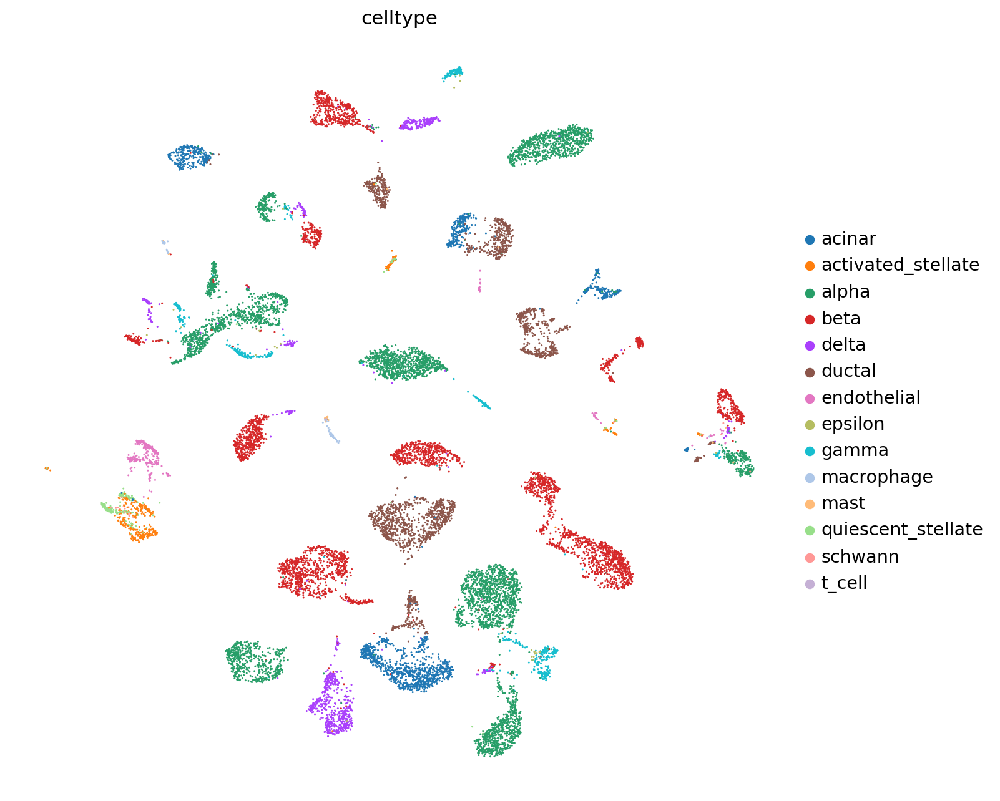

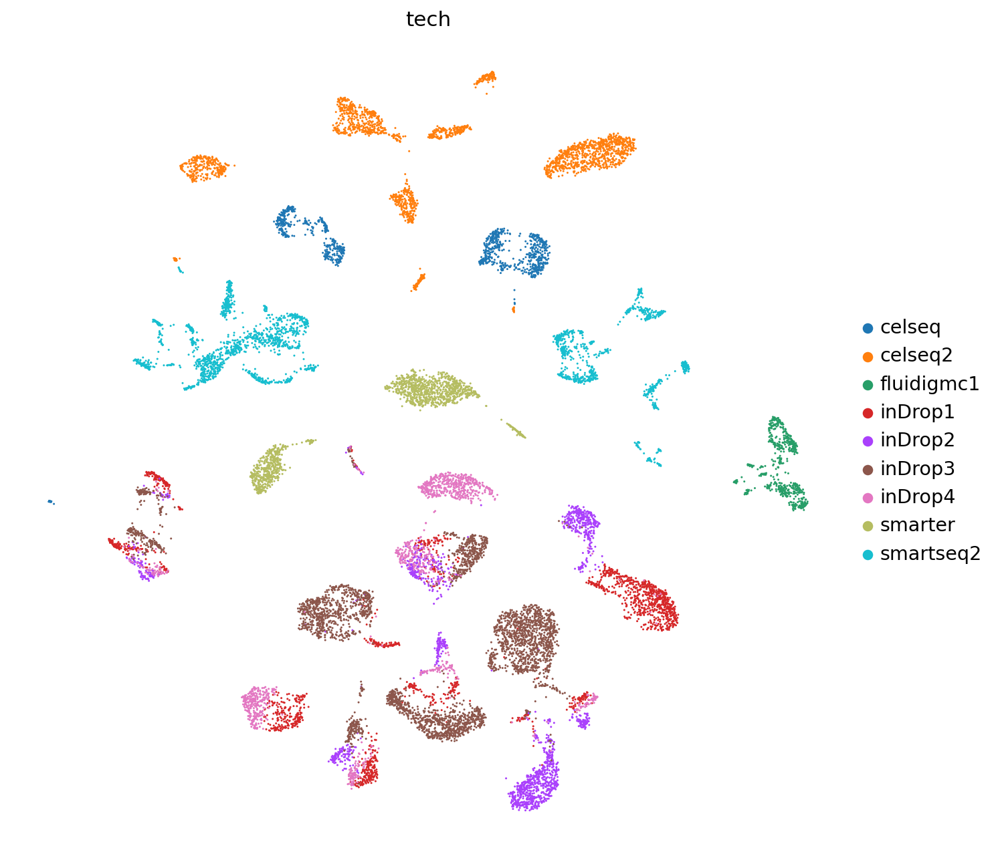

In [ ]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)

sc.pl.umap(
    adata,
    color=["celltype"],
    frameon=False,
)
sc.pl.umap(
    adata,
    color=["tech"],
    frameon=False,
)

# Make client's data

In [ ]:
import numpy as np
adata_shuffled = adata[np.random.permutation(adata.obs_names), :]
num_cells = adata_shuffled.shape[0]
num_clients = 5
cells_per_group = num_cells // num_clients

# Create groups
groups = [adata_shuffled[i*cells_per_group:(i+1)*cells_per_group] for i in range(num_clients)]

In [ ]:
groups[0].obs

,tech,celltype,size_factors
HP1504101T2D_A17,smartseq2,gamma,2.843453
human3_lib1.final_cell_0517,inDrop3,ductal,0.027218
D29-7_64,celseq2,alpha,0.188152
human1_lib1.final_cell_0021,inDrop1,beta,0.063109
HP1526901T2D_B18,smartseq2,delta,2.118381
...,...,...,...
D31-8_85,celseq2,ductal,0.159984
Sample_1321,smarter,alpha,1.000000
D74_85,celseq,alpha,0.078379
human1_lib2.final_cell_0177,inDrop1,acinar,0.031039


In [ ]:
import pandas as pd

for i in range(num_clients):
  groups[i].obs['tech'].to_csv(f'{i}_tech.csv', index=False)
  groups[i].obs['celltype'].to_csv(f'{i}_celltype.csv', index=False)

Client 0
 ------------------


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


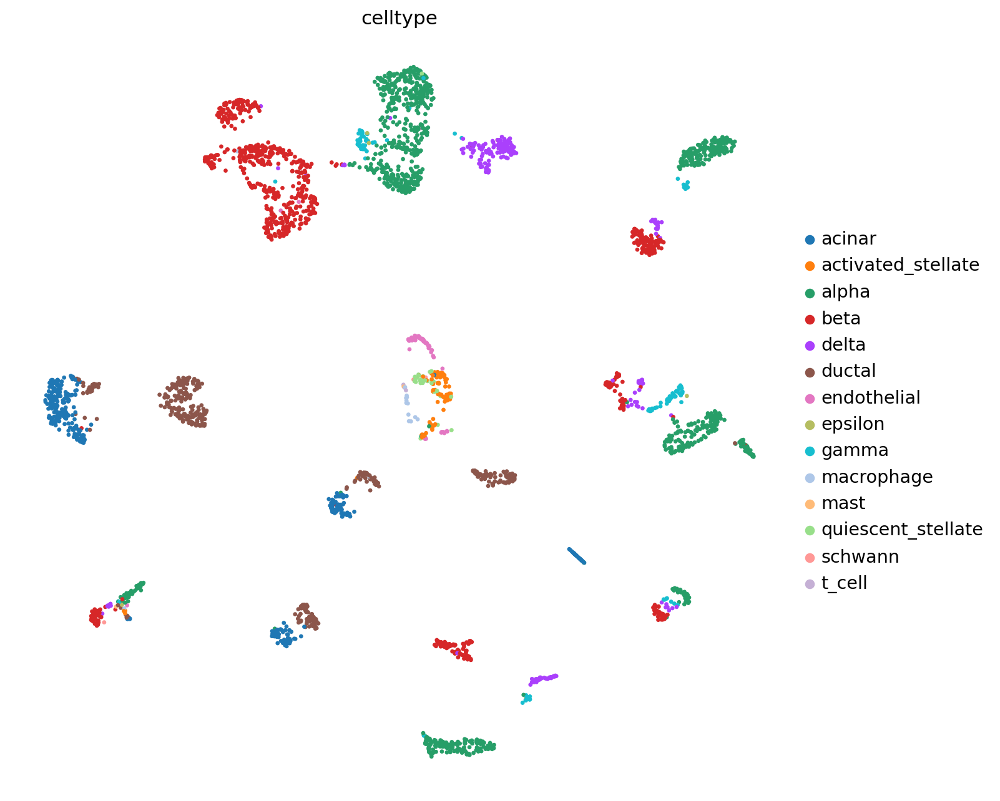

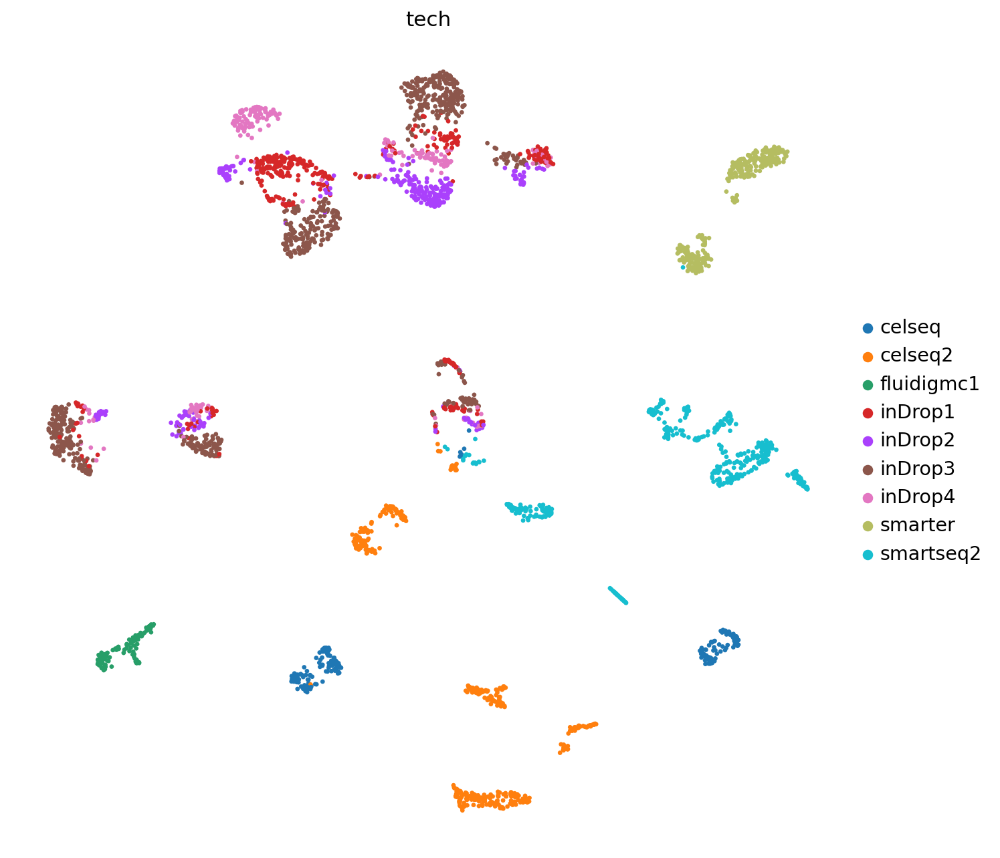

Client 1
 ------------------


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


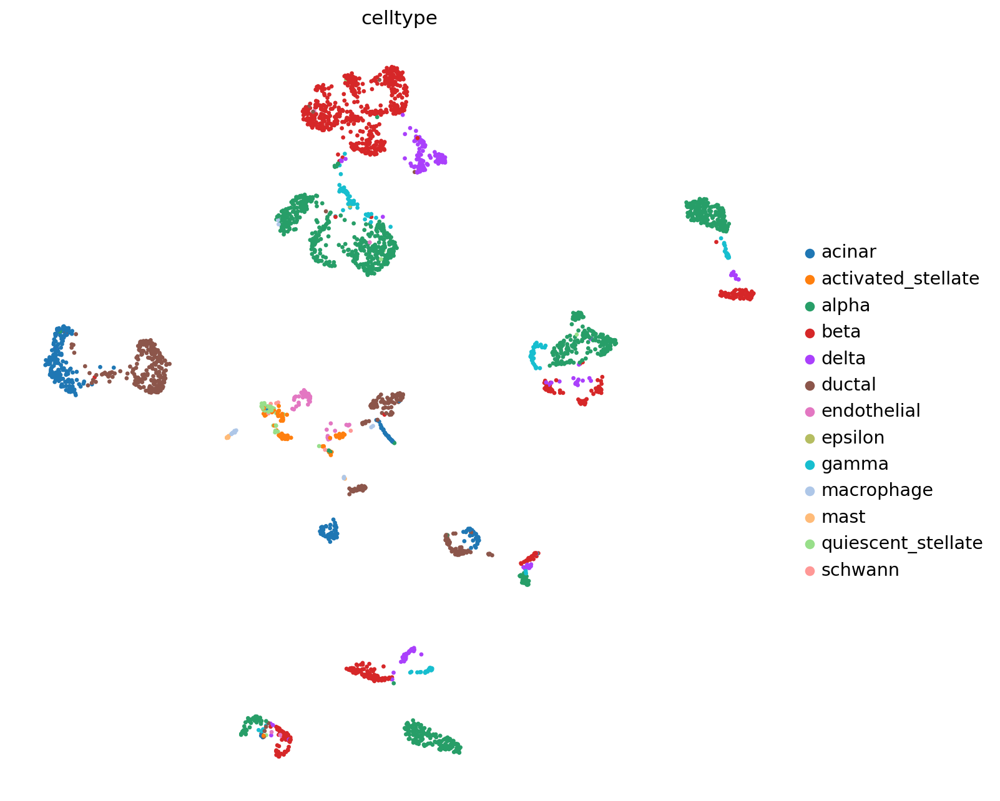

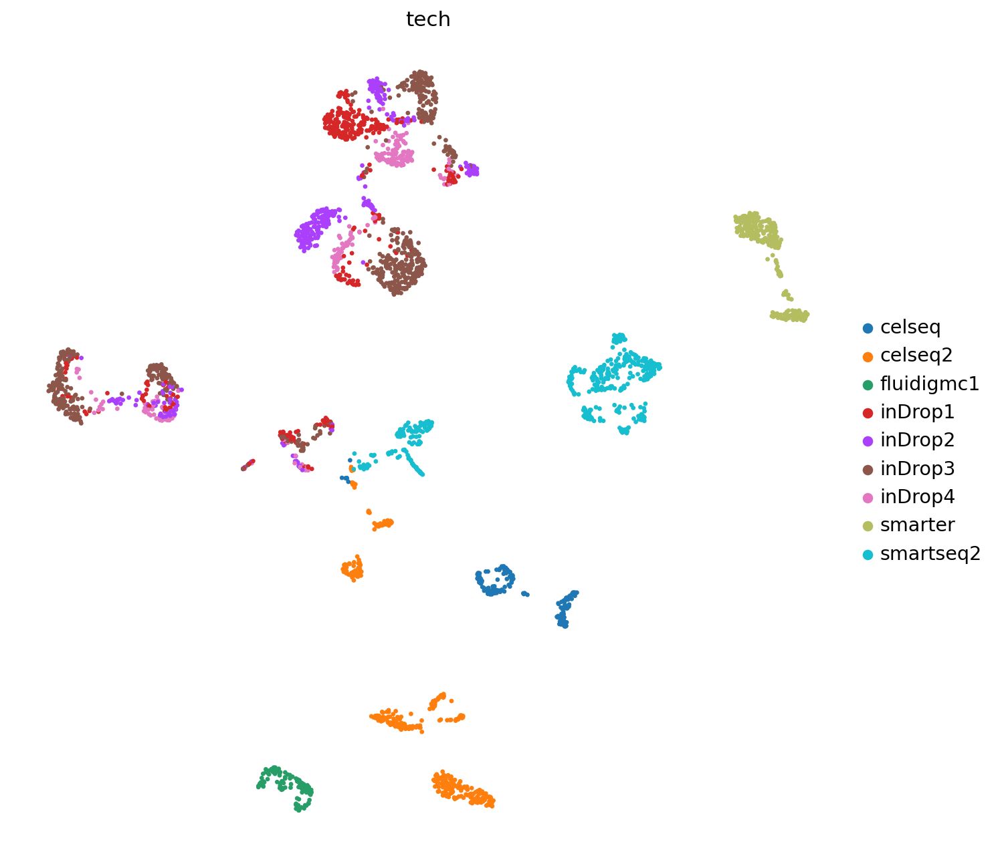

Client 2
 ------------------


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


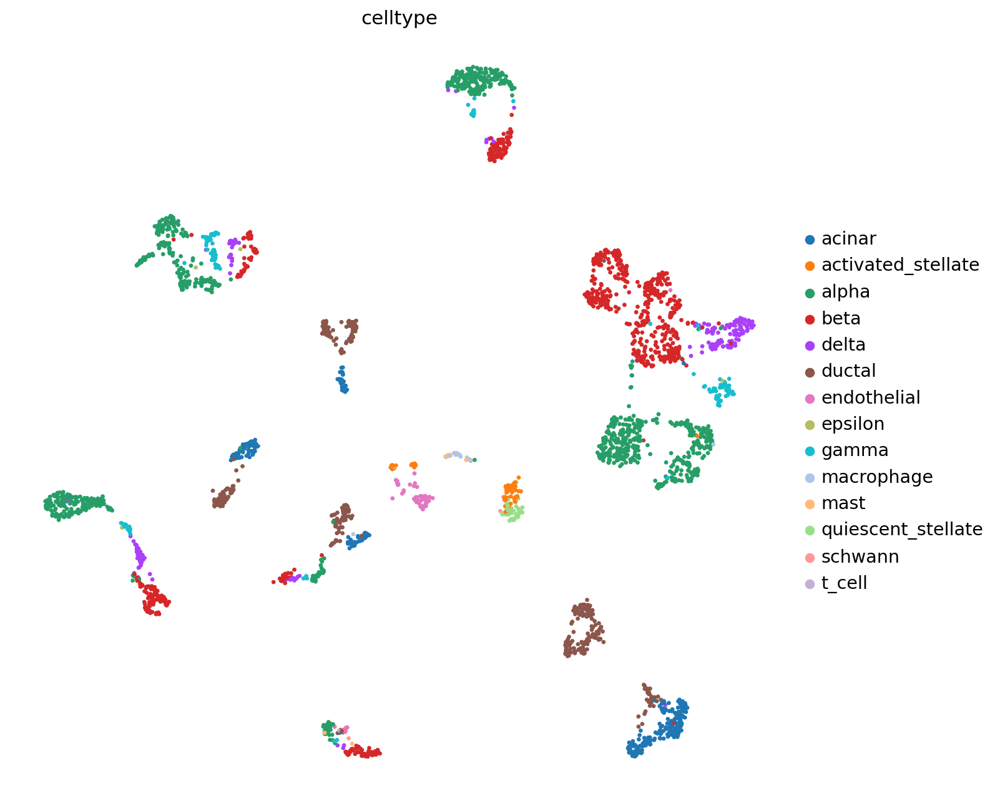

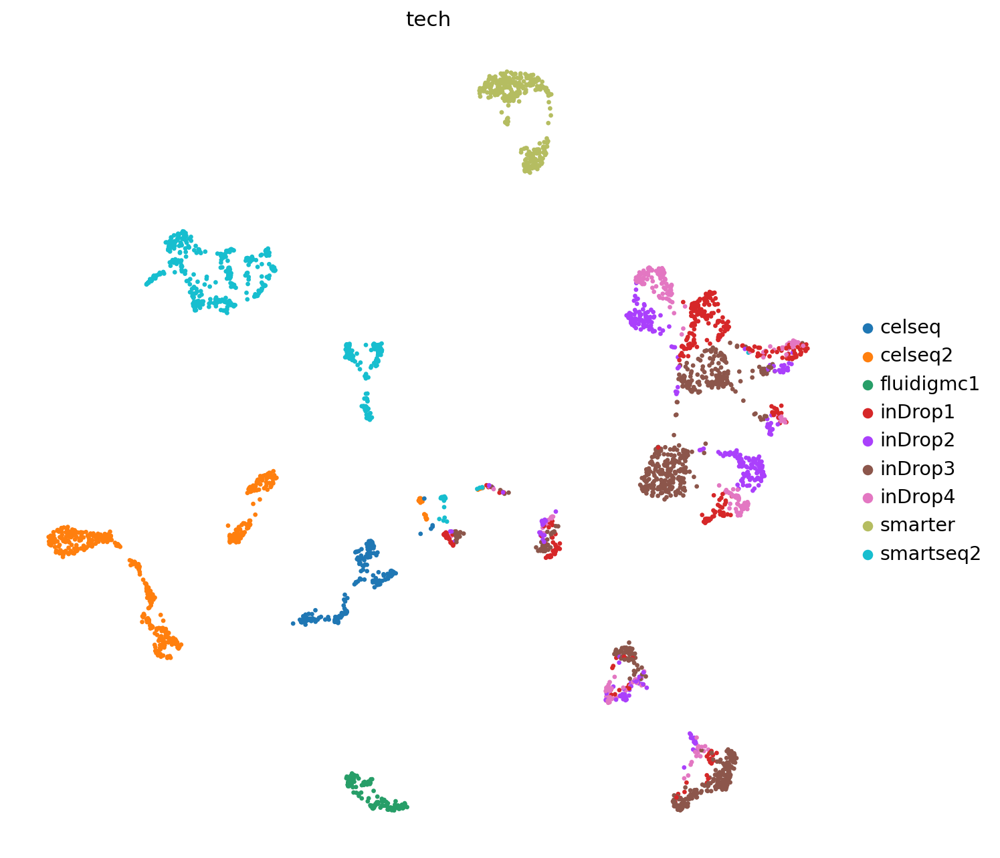

Client 3
 ------------------


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


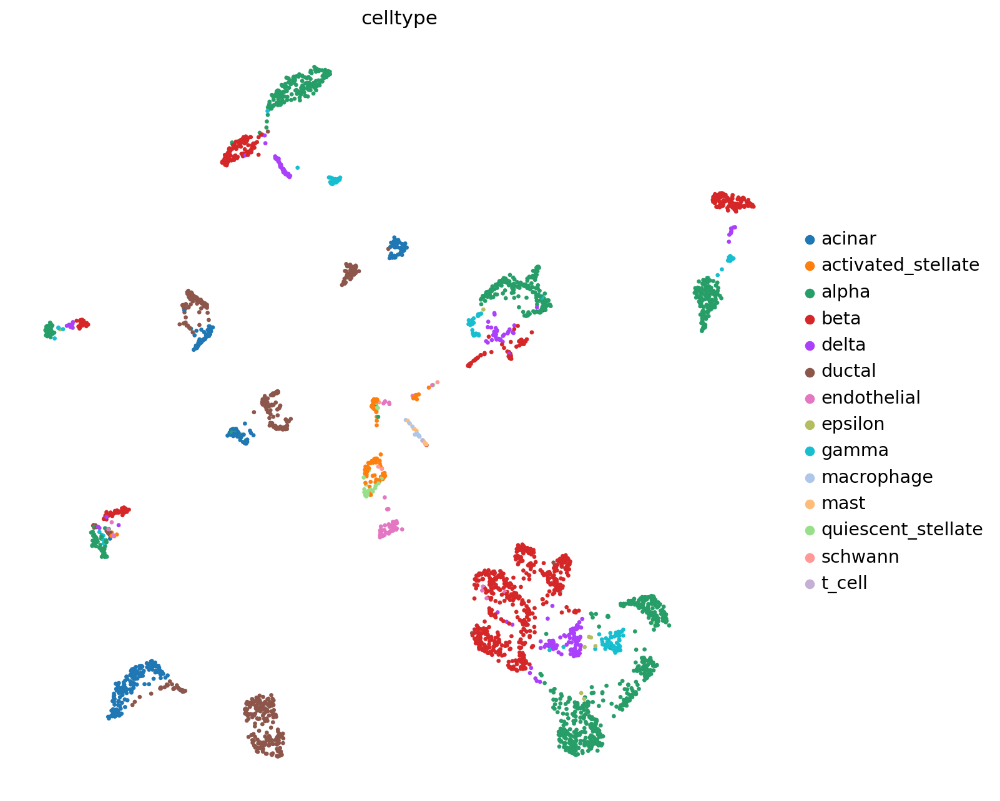

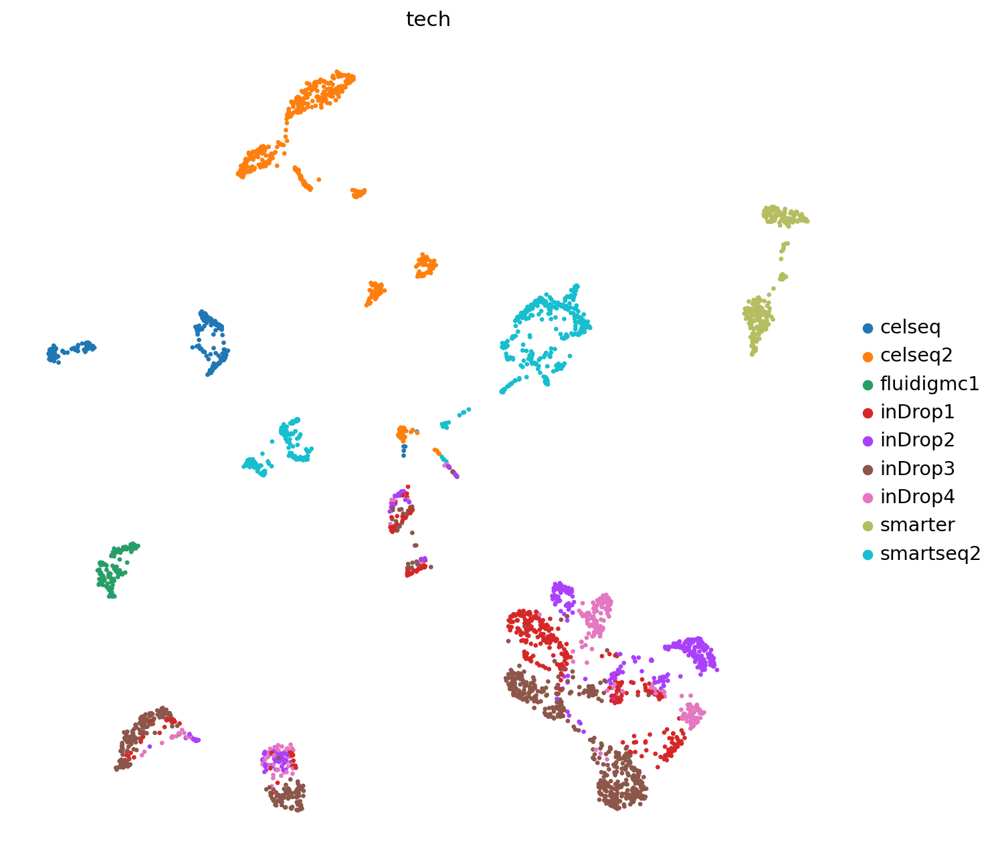

Client 4
 ------------------


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


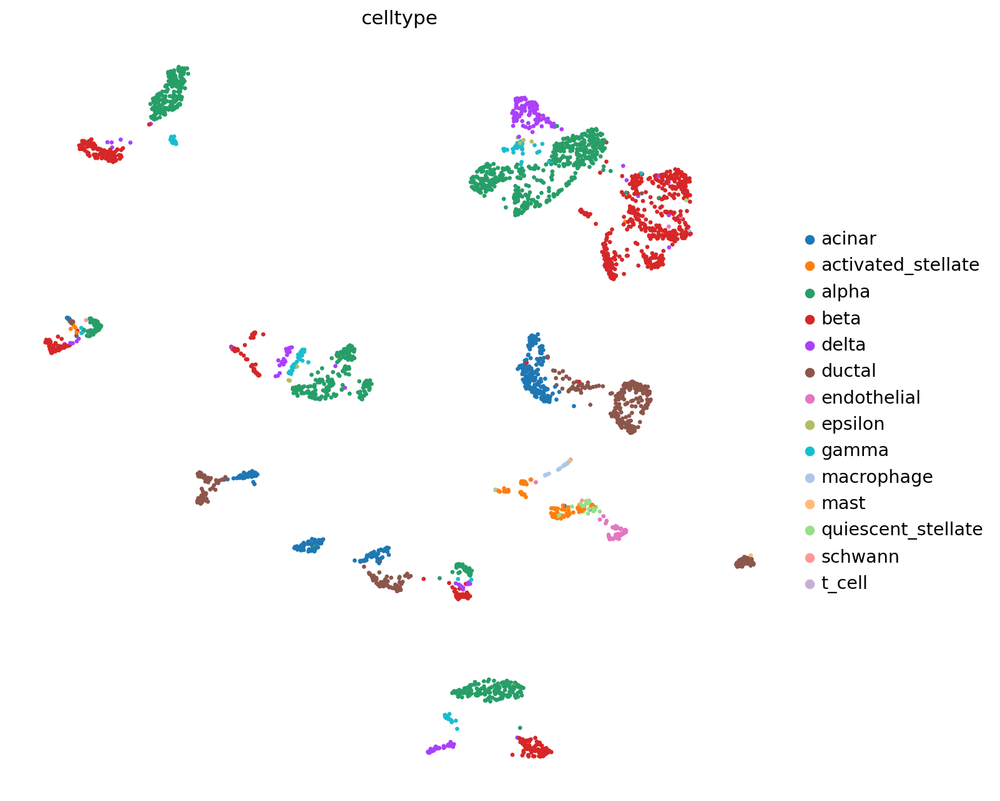

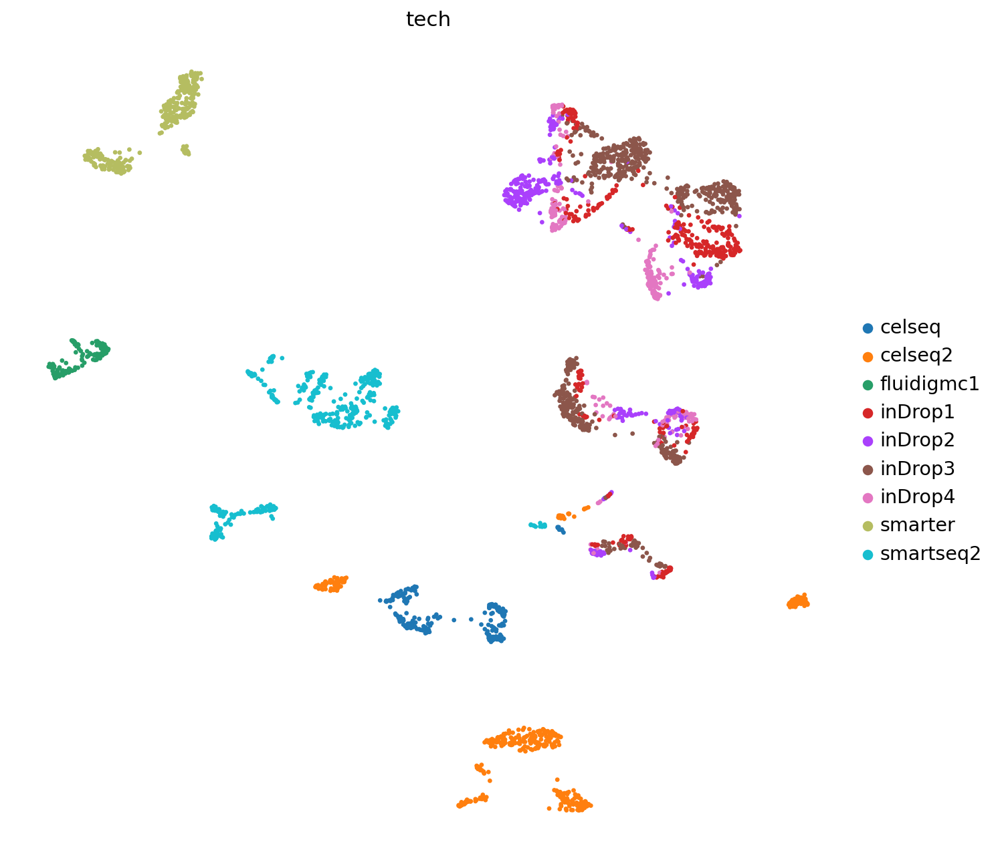

In [ ]:
# run PCA then generate UMAP plots

for i in range(num_clients):
  print(f'Client {i}\n ------------------')
  sc.tl.pca(groups[i])
  sc.pp.neighbors(groups[i], n_pcs=30, n_neighbors=20)
  sc.tl.umap(groups[i], min_dist=0.3)

  sc.pl.umap(
      groups[i],
      color=["celltype"],
      frameon=False,
      save=f'{i}_celltype_raw.pdf'
  )
  sc.pl.umap(
      groups[i],
      color=["tech"],
      frameon=False,
      save=f'{i}_tech_raw.pdf'
)

# scFedVI

In [ ]:
import torch

# Assuming you have 3 AnnData objects: adata1, adata2, adata3
# Initialize scVI models for each dataset
for adata in groups:
    scvi.model.SCVI.setup_anndata(adata,
                                  layer="counts",
                                  categorical_covariate_keys=["tech"])

models = [scvi.model.SCVI(adata) for adata in groups]

def average_weights(model_list):
    """
    Average the weights of multiple models, excluding non-floating point parameters.
    """
    # Initialize state_dict based on the first model
    state_dict = model_list[0].module.state_dict()

    # Iterate over all keys in the state_dict
    for key in state_dict.keys():
        # Check if the parameter is of floating point data type
        if state_dict[key].dtype.is_floating_point:
            # Average the floating point parameters
            state_dict[key] = torch.mean(torch.stack([model.module.state_dict()[key] for model in model_list]), dim=0)
    return state_dict


# Federated learning rounds
num_rounds = 5
for round in range(num_rounds):
    print(f"Round {round+1}/{num_rounds}")

    # Train each model
    for i, model in enumerate(models):
        model.train(max_epochs=20)

    # Average the weights
    averaged_state_dict = average_weights(models)

    # Update each model with the averaged weights
    for model in models:
        model.module.load_state_dict(averaged_state_dict)


/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnor

Round 1/5


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:01<00:26,  1.42s/it, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:15,  1.15it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:02<00:11,  1.48it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:09,  1.68it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:03<00:08,  1.82it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:07,  1.93it/s, v_num=1, train_loss_step=1.52e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:04<00:06,  1.99it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:05,  2.03it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:05<00:05,  2.07it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:04,  2.09it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:06<00:04,  2.10it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:06<00:03,  2.13it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:07<00:03,  2.14it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:07<00:02,  2.13it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.13it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:08<00:01,  2.13it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.15it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:10<00:00,  2.04it/s, v_num=1, train_loss_step=1.55e+4, train_loss_epoch=1.15e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:10<00:00,  1.93it/s, v_num=1, train_loss_step=1.55e+4, train_loss_epoch=1.15e+4]


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:10,  1.73it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:09,  1.94it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.04it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.10it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.12it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.14it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.15it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.15it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.16it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.17it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.16it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.16it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.17it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.17it/s, v_num=1, train_loss_step=9.83e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.17it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.15it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:07<00:01,  2.15it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=9.98e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.16it/s, v_num=1, train_loss_step=9.76e+3, train_loss_epoch=1.15e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s, v_num=1, train_loss_step=9.76e+3, train_loss_epoch=1.15e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.11it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.53e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.11it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.31e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  1.99it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.26e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.97it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.23e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  1.93it/s, v_num=1, train_loss_step=8.76e+3, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:07,  1.89it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  1.97it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:05,  2.03it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.07it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.10it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.11it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.13it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.16it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.16it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.15it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.15it/s, v_num=1, train_loss_step=1.6e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.16it/s, v_num=1, train_loss_step=1.58e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.16it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.15it/s, v_num=1, train_loss_step=9.43e+3, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.17e+4] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.17e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:08,  2.11it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.09it/s, v_num=1, train_loss_step=1.59e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.09it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.47e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.11it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.11it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.02it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  1.90it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:06,  1.46it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:06<00:05,  1.60it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:06<00:04,  1.75it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  1.86it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:07<00:03,  1.94it/s, v_num=1, train_loss_step=9.97e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.00it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:08<00:01,  2.06it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.10it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:09<00:00,  2.12it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=9.75e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:10<00:00,  2.16it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.15e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:10<00:00,  1.98it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.15e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:08,  2.11it/s, v_num=1, train_loss_step=1.46e+4, train_loss_epoch=1.51e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.09it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.29e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.11it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.12it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.14it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.16it/s, v_num=1, train_loss_step=1.61e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.16it/s, v_num=1, train_loss_step=1.46e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.17it/s, v_num=1, train_loss_step=1.63e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.16it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.16it/s, v_num=1, train_loss_step=9.36e+3, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.10it/s, v_num=1, train_loss_step=1.58e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.06it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.03it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  1.96it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:02,  1.98it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.04it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.07it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.08it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.15e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.09it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.15e+4]
Round 2/5


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.10it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.12it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.12it/s, v_num=1, train_loss_step=9.37e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.14it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.14it/s, v_num=1, train_loss_step=1.53e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.14it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.12it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.12it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.12it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.12it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.12it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.12it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.14it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.15it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.16it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.12it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.06it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.03it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  1.98it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  1.90it/s, v_num=1, train_loss_step=9.81e+3, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=9.81e+3, train_loss_epoch=1.12e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores


INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.09it/s, v_num=1, train_loss_step=9.79e+3, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.09it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.09it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.10it/s, v_num=1, train_loss_step=9.83e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.09it/s, v_num=1, train_loss_step=1.58e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.10it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.11it/s, v_num=1, train_loss_step=9.93e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.12it/s, v_num=1, train_loss_step=9.7e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.11it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.12it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.12it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.12it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.14it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.15it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.14it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.15it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.16it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:08<00:00,  2.15it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.16it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.12it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:10,  1.83it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:09,  1.88it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:09,  1.85it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.84it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  1.95it/s, v_num=1, train_loss_step=9.28e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:06,  2.01it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.06it/s, v_num=1, train_loss_step=9.94e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:05,  2.09it/s, v_num=1, train_loss_step=9.83e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.12it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.13it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.14it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.13it/s, v_num=1, train_loss_step=9.31e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.13it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.12it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.14it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.14it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.15it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.15it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.13e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.13e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.11it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.12it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:07,  2.14it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.02it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  1.99it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:06,  1.94it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  1.91it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:05,  1.98it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.02it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.05it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.02it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:03,  1.99it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  1.98it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:08<00:02,  1.87it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  1.90it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:09<00:01,  1.96it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.02it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.12e+4] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.00it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.12e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.09it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.10it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.11it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.08it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.10it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.12it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.09it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.09it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.10it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.02it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  1.98it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:04,  1.95it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  1.91it/s, v_num=1, train_loss_step=9.85e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:03,  1.98it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.02it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.05it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.07it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.06it/s, v_num=1, train_loss_step=8.7e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.04it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.12e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs



Round 3/5


INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.05it/s, v_num=1, train_loss_step=1.49e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.09it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.09it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.10it/s, v_num=1, train_loss_step=9.82e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.13it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.14it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.14it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.15it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.16it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.15it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.14it/s, v_num=1, train_loss_step=9.79e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.15it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.09it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.04it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.01it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  1.95it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:01,  1.95it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.00it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.04it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.1e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.1e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  1.97it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.04it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.07it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.09it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.12it/s, v_num=1, train_loss_step=9.28e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.12it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.12it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.12it/s, v_num=1, train_loss_step=1e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.12it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.13it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.12it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.13it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.13it/s, v_num=1, train_loss_step=9.7e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.13it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.12it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.13it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.14it/s, v_num=1, train_loss_step=8.68e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.15it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True


INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:10,  1.82it/s, v_num=1, train_loss_step=9.54e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:10,  1.77it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  1.91it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.98it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.01it/s, v_num=1, train_loss_step=1.47e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:06,  2.04it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.06it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:05,  2.06it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.08it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.10it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.09it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.11it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.13it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.12it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.14it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.13it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.13it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.12it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.13it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.11e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.11e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.07it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.09it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.05it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.93it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  1.91it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:07,  1.88it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  1.88it/s, v_num=1, train_loss_step=1.35e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:06,  1.95it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.00it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:04,  2.03it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.06it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:06<00:03,  2.08it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.10it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.10it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.13it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.13it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.14it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.06it/s, v_num=1, train_loss_step=1.45e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.12it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.13it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.12it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.13it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.05it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.02it/s, v_num=1, train_loss_step=9.6e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:05,  2.00it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  1.94it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:04,  1.93it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  1.97it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.01it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.05it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.09it/s, v_num=1, train_loss_step=9.93e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.10it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.10it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.13it/s, v_num=1, train_loss_step=11582.0, train_loss_epoch=1.1e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=11582.0, train_loss_epoch=1.1e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs



Round 4/5


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.05it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.11it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.12it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.11it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.12it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.13it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.10it/s, v_num=1, train_loss_step=9.89e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.10it/s, v_num=1, train_loss_step=9.63e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.11it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.12it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.05it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:03,  2.00it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  1.95it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:02,  1.88it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  1.96it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:01,  2.00it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.03it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.1e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.1e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.03it/s, v_num=1, train_loss_step=9.75e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.10it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=9.96e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.13it/s, v_num=1, train_loss_step=1.45e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.13it/s, v_num=1, train_loss_step=8.94e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.13it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.14it/s, v_num=1, train_loss_step=9.05e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.14it/s, v_num=1, train_loss_step=9.62e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.13it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.14it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.15it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.14it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.15it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.14it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.14it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.11it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.02it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  1.98it/s, v_num=1, train_loss_step=9.07e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  1.92it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.1e+4] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.1e+4]


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:10,  1.77it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:09,  1.96it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.04it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.09it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.12it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.11it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.12it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.12it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.11it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.13it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.13it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.14it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.15it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.15it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.15it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:08<00:00,  2.14it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.14it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.11e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.11e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  1.97it/s, v_num=1, train_loss_step=1.51e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:09,  1.85it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:09,  1.89it/s, v_num=1, train_loss_step=9.8e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.87it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:08,  1.84it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:07,  1.90it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  1.96it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:06,  1.99it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.01it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:04,  2.03it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.06it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:06<00:03,  2.08it/s, v_num=1, train_loss_step=9.05e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.09it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:07<00:02,  2.09it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.11it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.12it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.12it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.12it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.10it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.1e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.02it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=8.85e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.10it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.11it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.10it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.03it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  1.99it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.01it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  1.95it/s, v_num=1, train_loss_step=9.9e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:05,  1.91it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  1.97it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.01it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.05it/s, v_num=1, train_loss_step=9.86e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.08it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.07it/s, v_num=1, train_loss_step=9.99e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.08it/s, v_num=1, train_loss_step=9.68e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.09it/s, v_num=1, train_loss_step=9.32e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.10it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.09e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.09e+4]
Round 5/5


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.00it/s, v_num=1, train_loss_step=9.3e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.06it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.10it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.13it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.14it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.14it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.14it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.12it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.08it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.01it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  1.98it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:03,  1.91it/s, v_num=1, train_loss_step=9.7e+3, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  1.92it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:02,  1.99it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.04it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.07it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.08e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.09it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.08e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.10it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.08e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.08e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.03it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.09it/s, v_num=1, train_loss_step=1.45e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.11it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.12it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.12it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.11it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.07it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.05it/s, v_num=1, train_loss_step=9.79e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.06it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.07it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.08it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.09it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:02,  1.98it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  1.94it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:01,  1.91it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  1.88it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  1.95it/s, v_num=1, train_loss_step=1.72e+4, train_loss_epoch=1.09e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.03it/s, v_num=1, train_loss_step=1.72e+4, train_loss_epoch=1.09e+4]

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  1.98it/s, v_num=1, train_loss_step=9.87e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.06it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.09it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.12it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  2.11it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:02<00:06,  2.10it/s, v_num=1, train_loss_step=9.25e+3, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.11it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.11e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:03<00:05,  2.13it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.12it/s, v_num=1, train_loss_step=9.61e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.12it/s, v_num=1, train_loss_step=9.52e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.13it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.11it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.12it/s, v_num=1, train_loss_step=8.88e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.13it/s, v_num=1, train_loss_step=1.49e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.12it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.12it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.13it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.12it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:08<00:00,  2.13it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.08it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.1e+4]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.1e+4]


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:11,  1.69it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:01<00:10,  1.77it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:09,  1.78it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:02<00:08,  1.92it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  1.98it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:06,  2.03it/s, v_num=1, train_loss_step=9.88e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:06,  2.06it/s, v_num=1, train_loss_step=1.47e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:05,  2.09it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  2.11it/s, v_num=1, train_loss_step=9701.0, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:04<00:04,  2.11it/s, v_num=1, train_loss_step=1.5e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  2.12it/s, v_num=1, train_loss_step=8.92e+3, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:05<00:03,  2.13it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.14it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:06<00:02,  2.14it/s, v_num=1, train_loss_step=9.62e+3, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.14it/s, v_num=1, train_loss_step=9.17e+3, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:07<00:01,  2.14it/s, v_num=1, train_loss_step=9.99e+3, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.13it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:08<00:00,  2.09it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.10it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.11it/s, v_num=1, train_loss_step=9.9e+3, train_loss_epoch=1.09e+4] 

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=9.9e+3, train_loss_epoch=1.09e+4]


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:00<00:09,  2.04it/s, v_num=1, train_loss_step=9.54e+3, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:00<00:08,  2.08it/s, v_num=1, train_loss_step=1.46e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:01<00:08,  2.10it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.1e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:01<00:07,  2.03it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [00:02<00:07,  1.95it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [00:03<00:07,  1.91it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [00:03<00:07,  1.84it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [00:04<00:06,  1.85it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [00:04<00:05,  1.92it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [00:05<00:05,  1.93it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [00:05<00:04,  1.98it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [00:06<00:03,  2.02it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [00:06<00:03,  2.04it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [00:07<00:02,  2.06it/s, v_num=1, train_loss_step=1.35e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [00:07<00:02,  2.07it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [00:08<00:01,  2.09it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [00:08<00:01,  2.05it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [00:09<00:00,  2.06it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.09e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [00:09<00:00,  2.05it/s, v_num=1, train_loss_step=1.09e+4, train_loss_epoch=1.08e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s, v_num=1, train_loss_step=1e+4, train_loss_epoch=1.08e+4]   

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:09<00:00,  2.01it/s, v_num=1, train_loss_step=1e+4, train_loss_epoch=1.08e+4]


In [ ]:
latent = models[0].get_latent_representation()
latent.shape

(3276, 10)

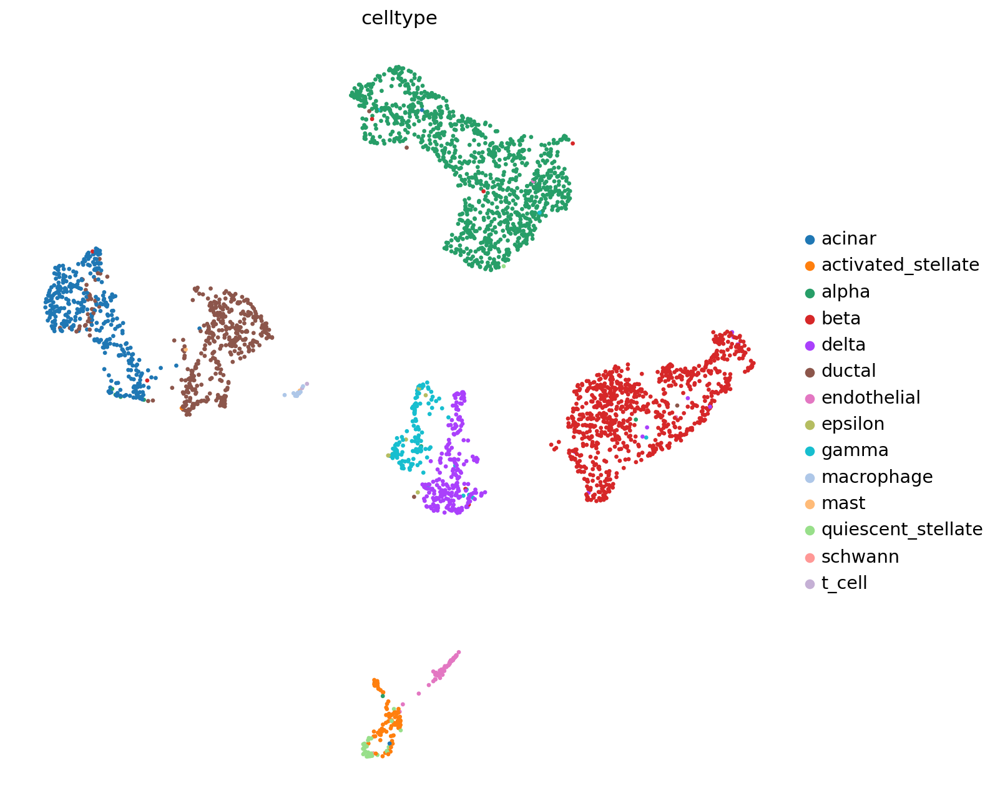

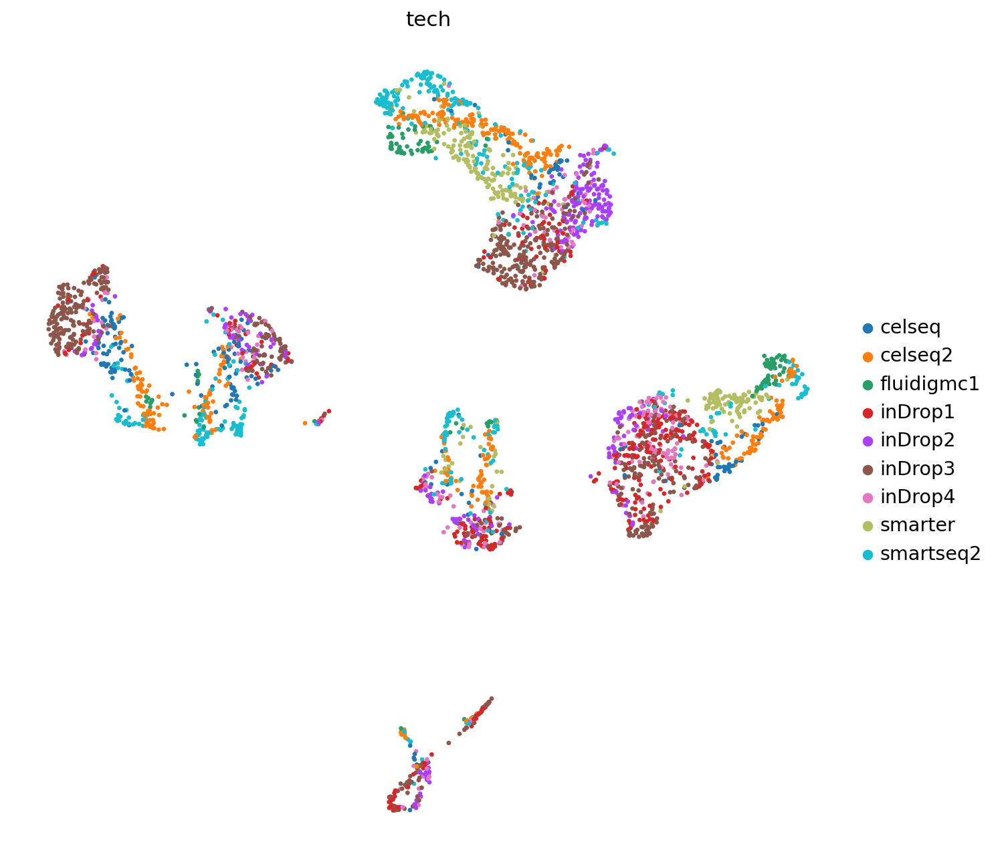

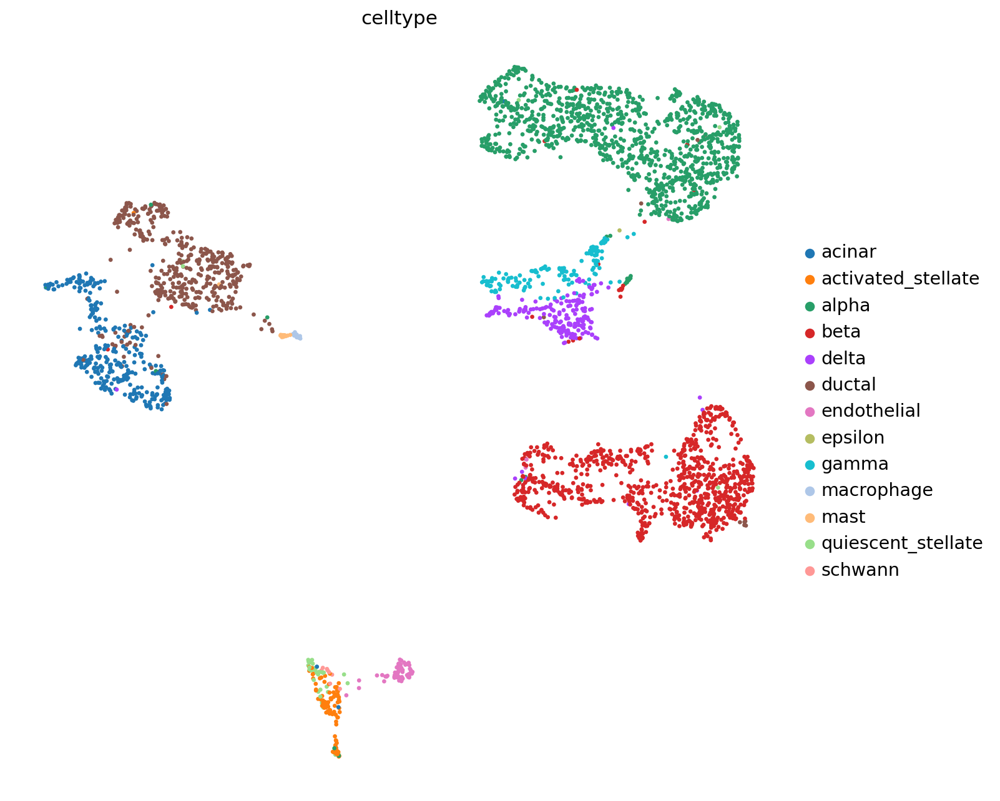

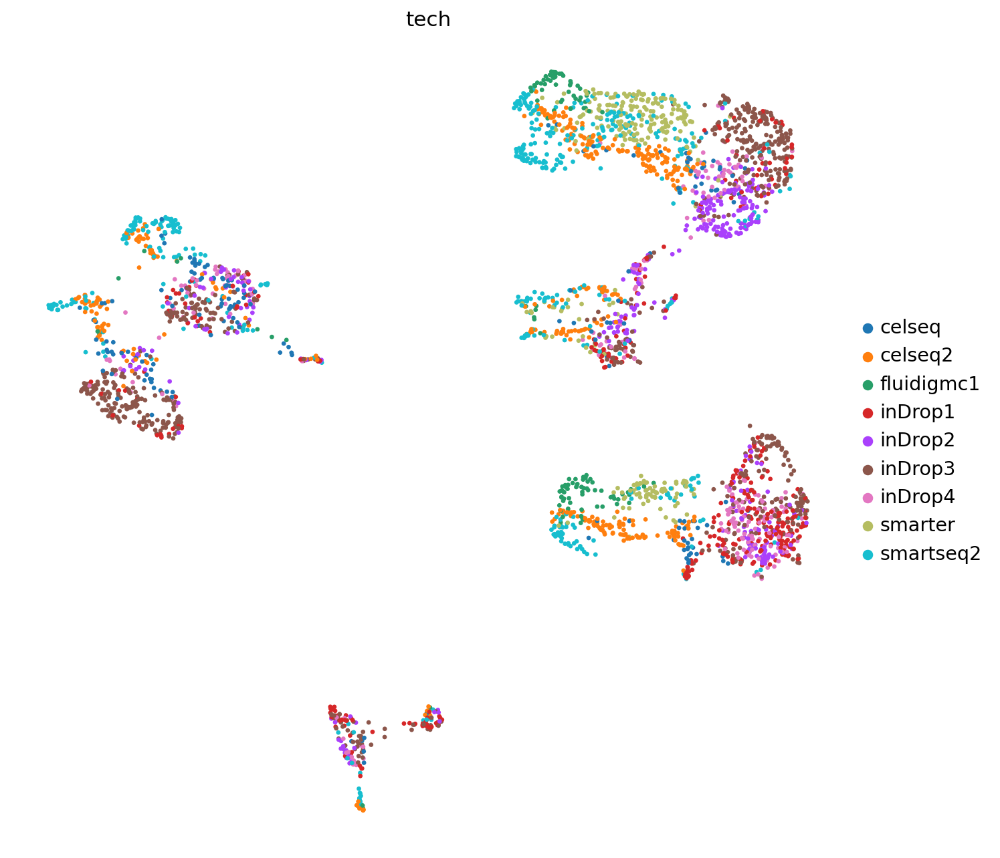

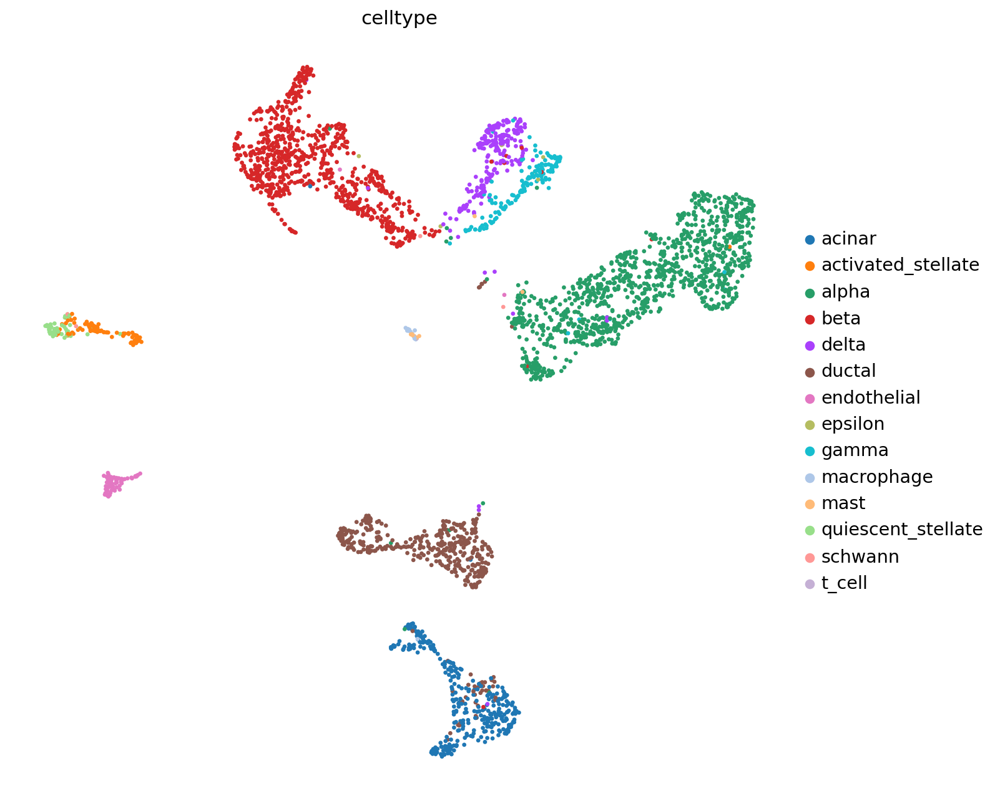

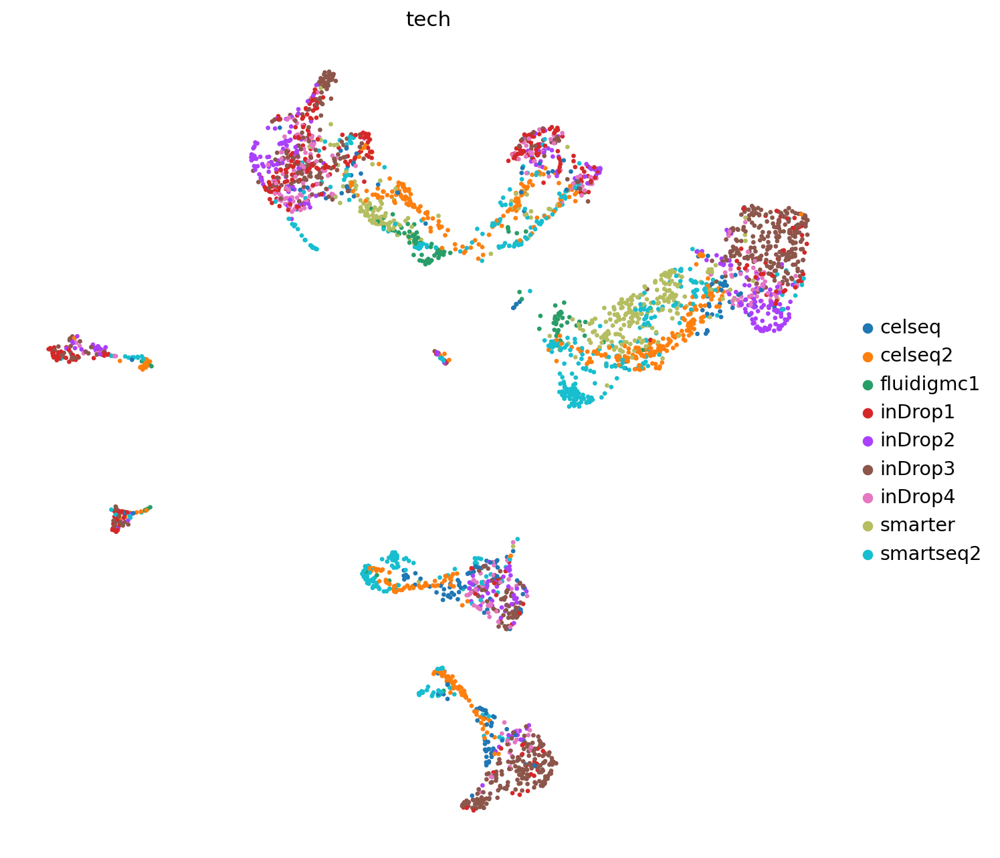

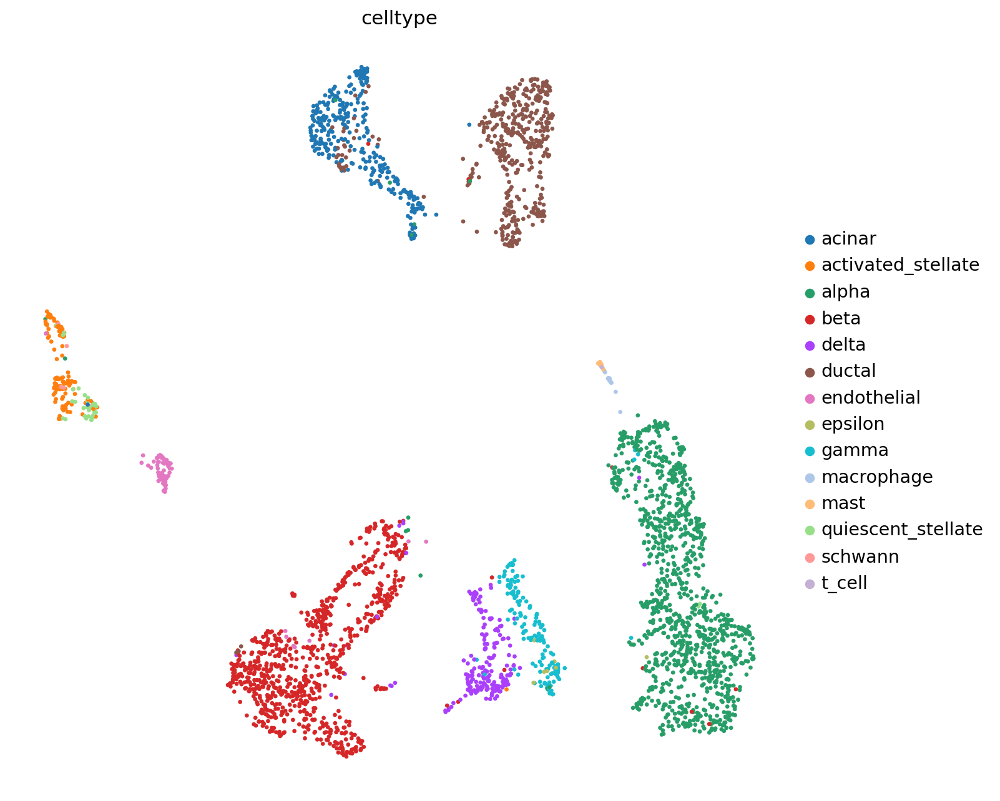

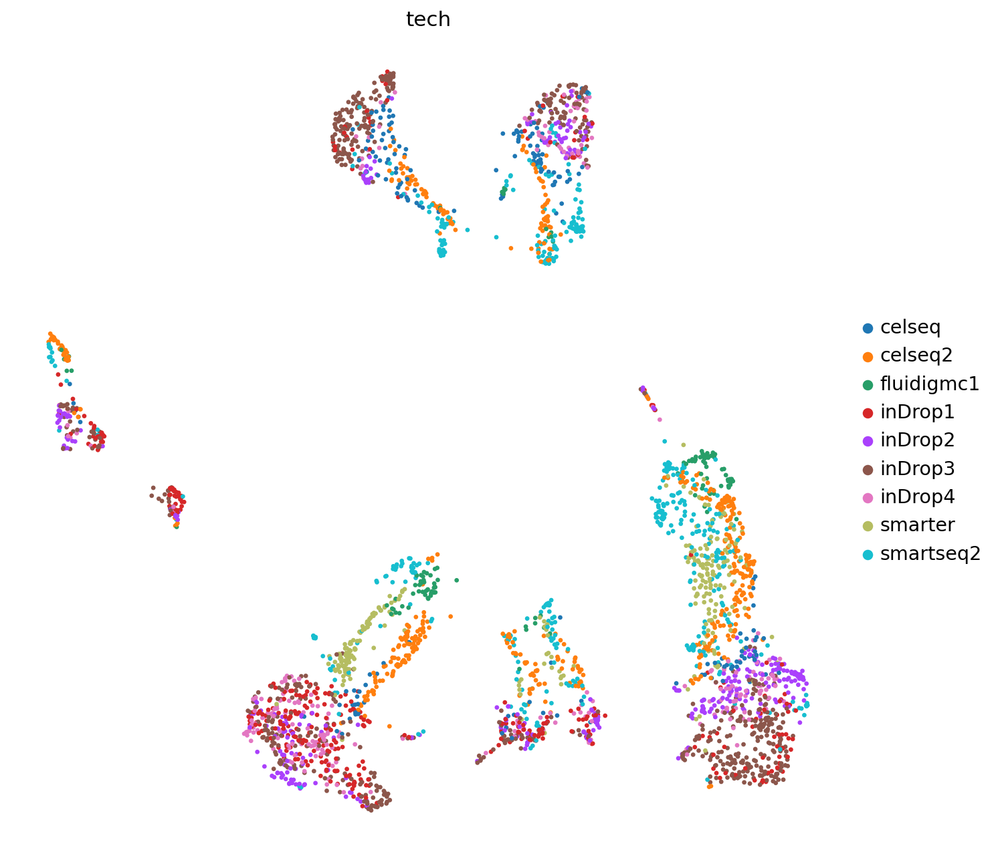

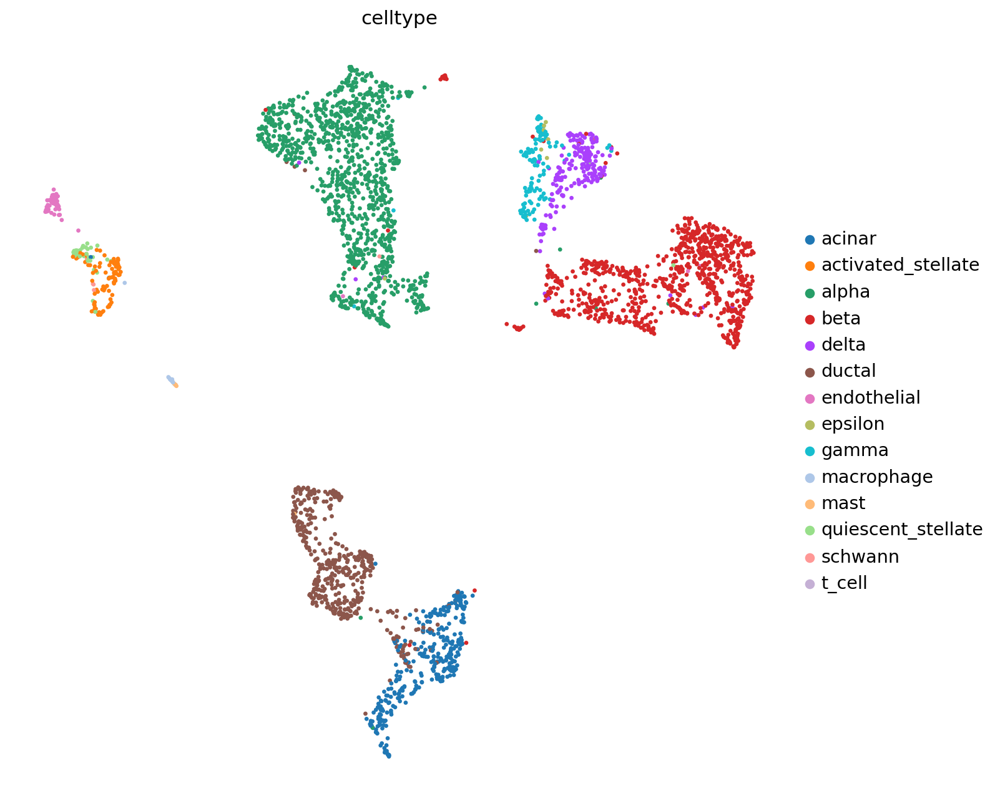

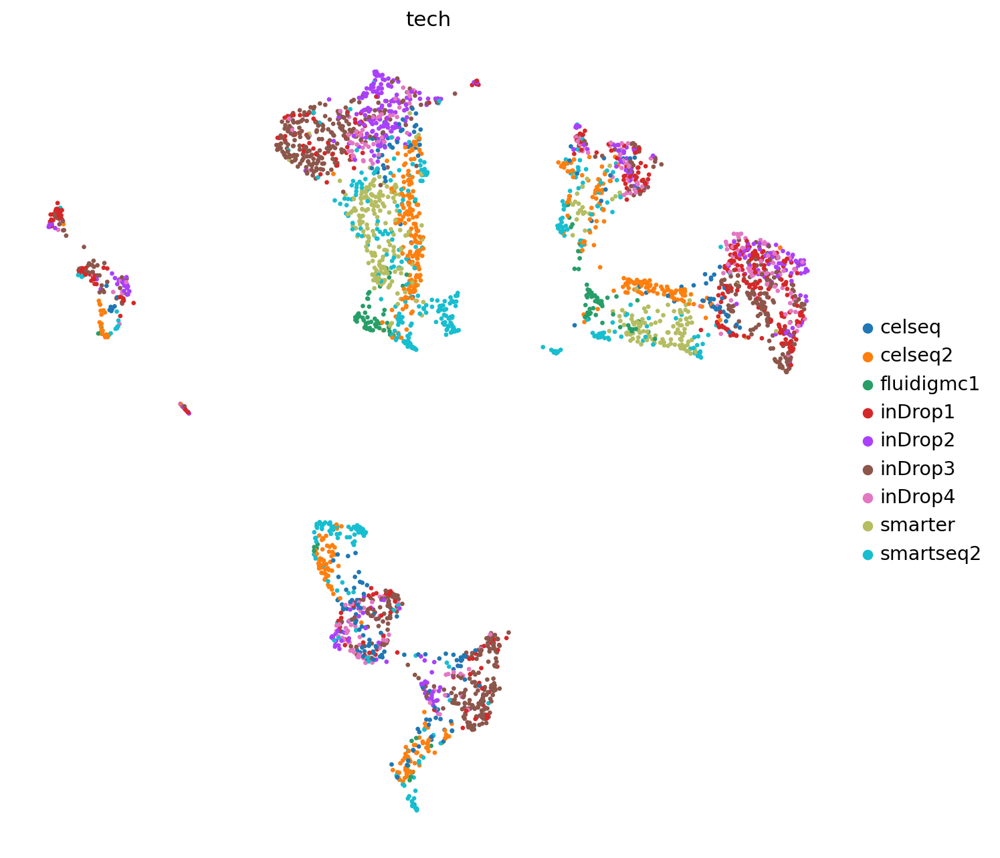

In [ ]:
for i, model in enumerate(models):
  latent = model.get_latent_representation()
  np.save(f'latent_scFedVI_{i}', latent)
  groups[i].obsm["X_scVI_Fed"] = latent

  sc.pp.neighbors(groups[i], use_rep="X_scVI_Fed")
  sc.tl.umap(groups[i], min_dist=0.3)

  sc.pl.umap(
      groups[i],
      color=["celltype"],
      frameon=False,
      save=f'{i}_celltype_scFedVI.pdf'
  )
  sc.pl.umap(
      groups[i],
      color=["tech"],
      frameon=False,
      save=f'{i}_tech_scFedVI.pdf'
  )

# Individual IID Models

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/50:   2%|▏         | 1/50 [00:00<00:28,  1.74it/s, v_num=1, train_loss_step=1.56e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/50:   4%|▍         | 2/50 [00:01<00:27,  1.78it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/50:   6%|▌         | 3/50 [00:01<00:24,  1.94it/s, v_num=1, train_loss_step=1.55e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/50:   8%|▊         | 4/50 [00:02<00:22,  2.01it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/50:  10%|█         | 5/50 [00:02<00:21,  2.06it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/50:  12%|█▏        | 6/50 [00:02<00:21,  2.09it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/50:  14%|█▍        | 7/50 [00:03<00:20,  2.11it/s, v_num=1, train_loss_step=1.45e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/50:  16%|█▌        | 8/50 [00:03<00:19,  2.12it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/50:  18%|█▊        | 9/50 [00:04<00:19,  2.12it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/50:  20%|██        | 10/50 [00:04<00:18,  2.13it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/50:  22%|██▏       | 11/50 [00:05<00:18,  2.14it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/50:  24%|██▍       | 12/50 [00:05<00:17,  2.15it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/50:  26%|██▌       | 13/50 [00:06<00:17,  2.15it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/50:  28%|██▊       | 14/50 [00:06<00:16,  2.17it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/50:  30%|███       | 15/50 [00:07<00:16,  2.17it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/50:  32%|███▏      | 16/50 [00:07<00:15,  2.18it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/50:  34%|███▍      | 17/50 [00:08<00:15,  2.18it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/50:  36%|███▌      | 18/50 [00:08<00:14,  2.17it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/50:  38%|███▊      | 19/50 [00:09<00:14,  2.17it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 21/50:  40%|████      | 20/50 [00:09<00:13,  2.16it/s, v_num=1, train_loss_step=1.46e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 22/50:  42%|████▏     | 21/50 [00:09<00:13,  2.17it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 23/50:  44%|████▍     | 22/50 [00:10<00:12,  2.17it/s, v_num=1, train_loss_step=9.18e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 24/50:  46%|████▌     | 23/50 [00:10<00:12,  2.17it/s, v_num=1, train_loss_step=1e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 25/50:  48%|████▊     | 24/50 [00:11<00:12,  2.09it/s, v_num=1, train_loss_step=9.85e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 26/50:  50%|█████     | 25/50 [00:11<00:12,  2.03it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 27/50:  52%|█████▏    | 26/50 [00:12<00:12,  1.95it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 28/50:  54%|█████▍    | 27/50 [00:12<00:11,  2.01it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 29/50:  56%|█████▌    | 28/50 [00:13<00:10,  2.03it/s, v_num=1, train_loss_step=1.51e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 30/50:  58%|█████▊    | 29/50 [00:13<00:10,  2.05it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 31/50:  60%|██████    | 30/50 [00:14<00:09,  2.05it/s, v_num=1, train_loss_step=1.54e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 32/50:  62%|██████▏   | 31/50 [00:14<00:09,  2.07it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 33/50:  64%|██████▍   | 32/50 [00:15<00:08,  2.07it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 34/50:  66%|██████▌   | 33/50 [00:15<00:08,  2.11it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 35/50:  68%|██████▊   | 34/50 [00:16<00:07,  2.10it/s, v_num=1, train_loss_step=9.79e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 36/50:  70%|███████   | 35/50 [00:16<00:07,  2.10it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 37/50:  72%|███████▏  | 36/50 [00:17<00:06,  2.11it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 38/50:  74%|███████▍  | 37/50 [00:17<00:06,  2.12it/s, v_num=1, train_loss_step=1.35e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 39/50:  76%|███████▌  | 38/50 [00:18<00:05,  2.12it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 40/50:  78%|███████▊  | 39/50 [00:18<00:05,  2.13it/s, v_num=1, train_loss_step=9.29e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 41/50:  80%|████████  | 40/50 [00:19<00:04,  2.15it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 42/50:  82%|████████▏ | 41/50 [00:19<00:04,  2.16it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 43/50:  84%|████████▍ | 42/50 [00:19<00:03,  2.17it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=11261.0]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 44/50:  86%|████████▌ | 43/50 [00:20<00:03,  2.16it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 45/50:  88%|████████▊ | 44/50 [00:20<00:02,  2.16it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 46/50:  90%|█████████ | 45/50 [00:21<00:02,  2.15it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 47/50:  92%|█████████▏| 46/50 [00:21<00:01,  2.14it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 48/50:  94%|█████████▍| 47/50 [00:22<00:01,  2.13it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 49/50:  96%|█████████▌| 48/50 [00:22<00:00,  2.03it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50:  98%|█████████▊| 49/50 [00:23<00:00,  2.02it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50: 100%|██████████| 50/50 [00:23<00:00,  1.96it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:23<00:00,  2.09it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]


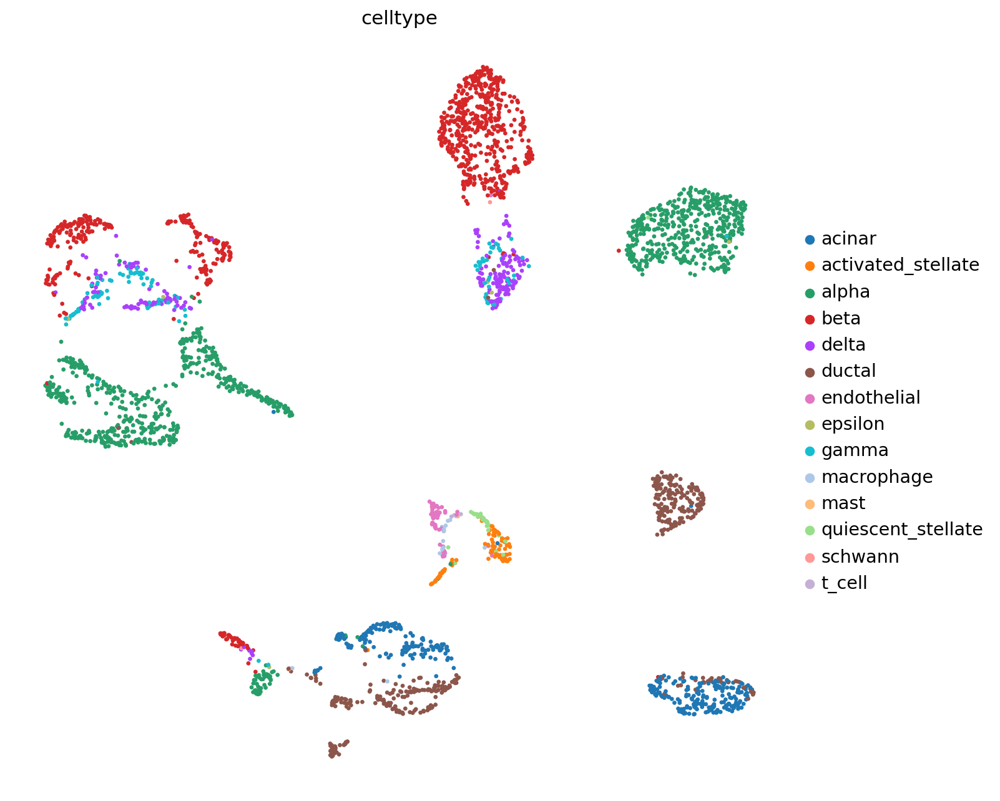

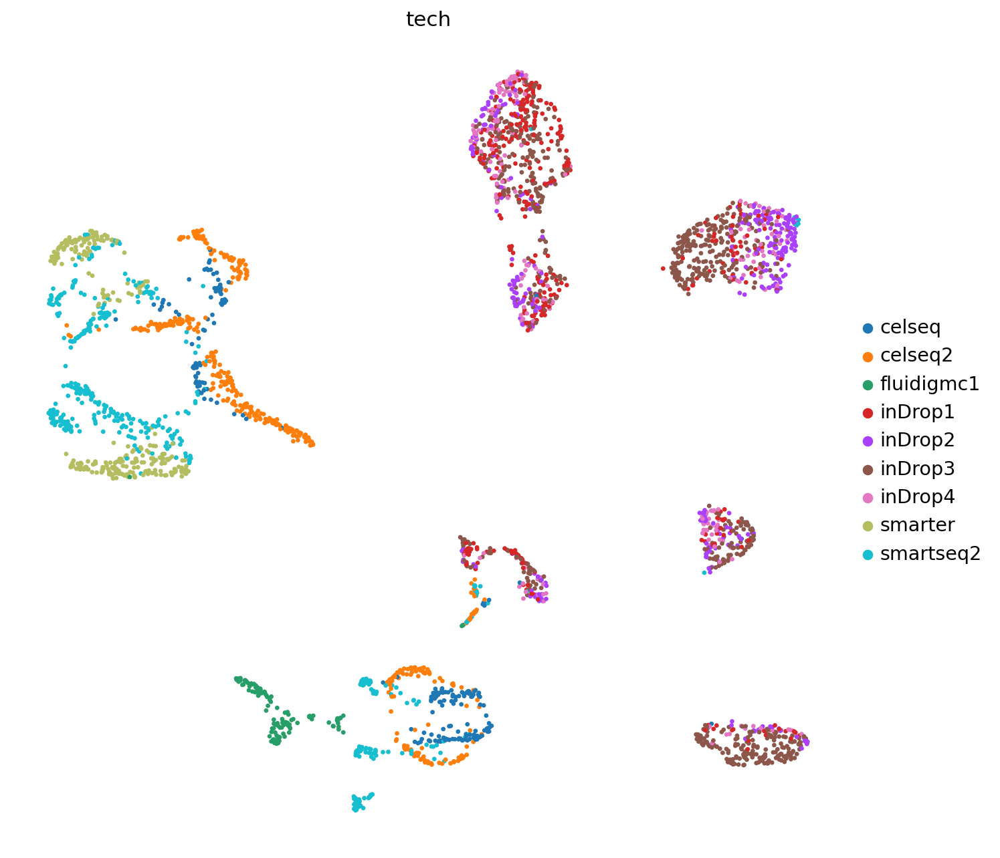

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/50:   2%|▏         | 1/50 [00:00<00:25,  1.96it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/50:   4%|▍         | 2/50 [00:01<00:23,  2.01it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/50:   6%|▌         | 3/50 [00:01<00:23,  2.02it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/50:   8%|▊         | 4/50 [00:02<00:23,  1.97it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/50:  10%|█         | 5/50 [00:02<00:23,  1.93it/s, v_num=1, train_loss_step=8.67e+3, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/50:  12%|█▏        | 6/50 [00:03<00:23,  1.86it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/50:  14%|█▍        | 7/50 [00:03<00:23,  1.86it/s, v_num=1, train_loss_step=1.31e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/50:  16%|█▌        | 8/50 [00:04<00:21,  1.94it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/50:  18%|█▊        | 9/50 [00:04<00:20,  2.01it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/50:  20%|██        | 10/50 [00:05<00:19,  2.04it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/50:  22%|██▏       | 11/50 [00:05<00:18,  2.07it/s, v_num=1, train_loss_step=1.41e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/50:  24%|██▍       | 12/50 [00:06<00:18,  2.07it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/50:  26%|██▌       | 13/50 [00:06<00:17,  2.07it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/50:  28%|██▊       | 14/50 [00:06<00:17,  2.08it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/50:  30%|███       | 15/50 [00:07<00:16,  2.11it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/50:  32%|███▏      | 16/50 [00:07<00:16,  2.12it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/50:  34%|███▍      | 17/50 [00:08<00:15,  2.12it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/50:  36%|███▌      | 18/50 [00:08<00:15,  2.13it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/50:  38%|███▊      | 19/50 [00:09<00:14,  2.13it/s, v_num=1, train_loss_step=1.79e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 21/50:  40%|████      | 20/50 [00:09<00:13,  2.15it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 22/50:  42%|████▏     | 21/50 [00:10<00:13,  2.14it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 23/50:  44%|████▍     | 22/50 [00:10<00:13,  2.15it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 24/50:  46%|████▌     | 23/50 [00:11<00:12,  2.11it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 25/50:  48%|████▊     | 24/50 [00:11<00:12,  2.10it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 26/50:  50%|█████     | 25/50 [00:12<00:11,  2.11it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 27/50:  52%|█████▏    | 26/50 [00:12<00:11,  2.11it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 28/50:  54%|█████▍    | 27/50 [00:13<00:10,  2.12it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 29/50:  56%|█████▌    | 28/50 [00:13<00:10,  2.11it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 30/50:  58%|█████▊    | 29/50 [00:14<00:10,  2.05it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 31/50:  60%|██████    | 30/50 [00:14<00:09,  2.02it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 32/50:  62%|██████▏   | 31/50 [00:15<00:09,  1.95it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 33/50:  64%|██████▍   | 32/50 [00:15<00:09,  1.90it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 34/50:  66%|██████▌   | 33/50 [00:16<00:08,  1.97it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 35/50:  68%|██████▊   | 34/50 [00:16<00:07,  2.01it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 36/50:  70%|███████   | 35/50 [00:17<00:07,  2.05it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 37/50:  72%|███████▏  | 36/50 [00:17<00:06,  2.06it/s, v_num=1, train_loss_step=9.35e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 38/50:  74%|███████▍  | 37/50 [00:18<00:06,  2.07it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 39/50:  76%|███████▌  | 38/50 [00:18<00:05,  2.09it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 40/50:  78%|███████▊  | 39/50 [00:19<00:05,  2.10it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 41/50:  80%|████████  | 40/50 [00:19<00:04,  2.10it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 42/50:  82%|████████▏ | 41/50 [00:19<00:04,  2.11it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 43/50:  84%|████████▍ | 42/50 [00:20<00:03,  2.13it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 44/50:  86%|████████▌ | 43/50 [00:20<00:03,  2.13it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 45/50:  88%|████████▊ | 44/50 [00:21<00:02,  2.13it/s, v_num=1, train_loss_step=1.35e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 46/50:  90%|█████████ | 45/50 [00:21<00:02,  2.12it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 47/50:  92%|█████████▏| 46/50 [00:22<00:01,  2.13it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 48/50:  94%|█████████▍| 47/50 [00:22<00:01,  2.14it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 49/50:  96%|█████████▌| 48/50 [00:23<00:00,  2.14it/s, v_num=1, train_loss_step=9.88e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50:  98%|█████████▊| 49/50 [00:23<00:00,  2.13it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.13it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.07it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.12e+4]


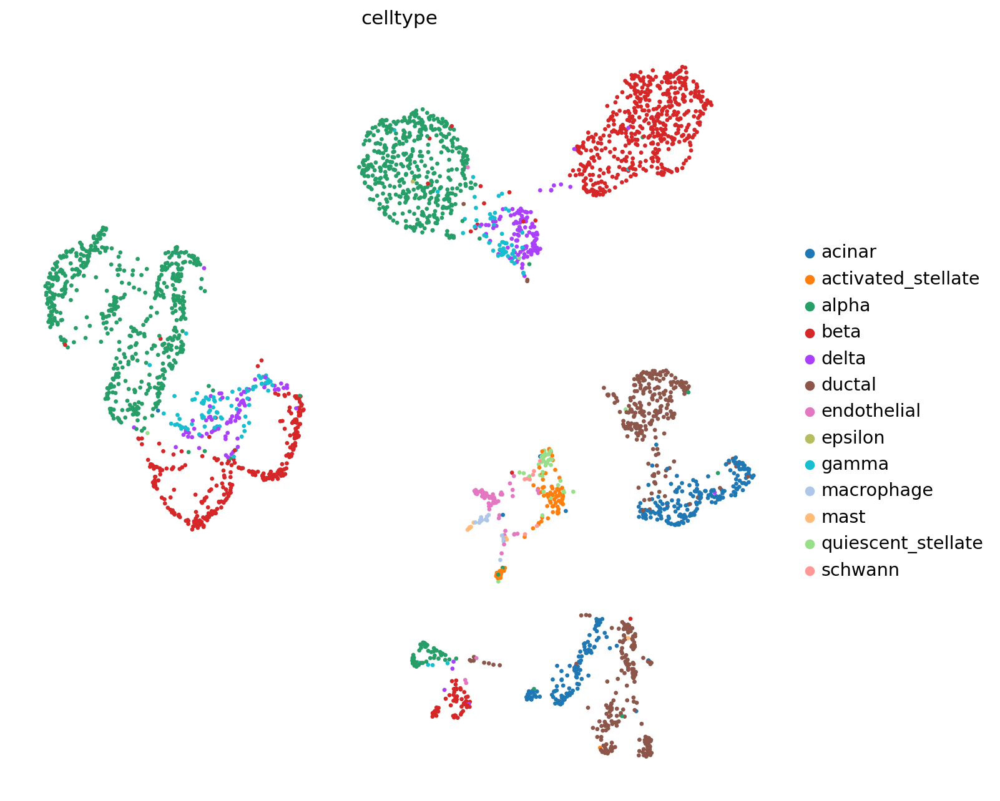

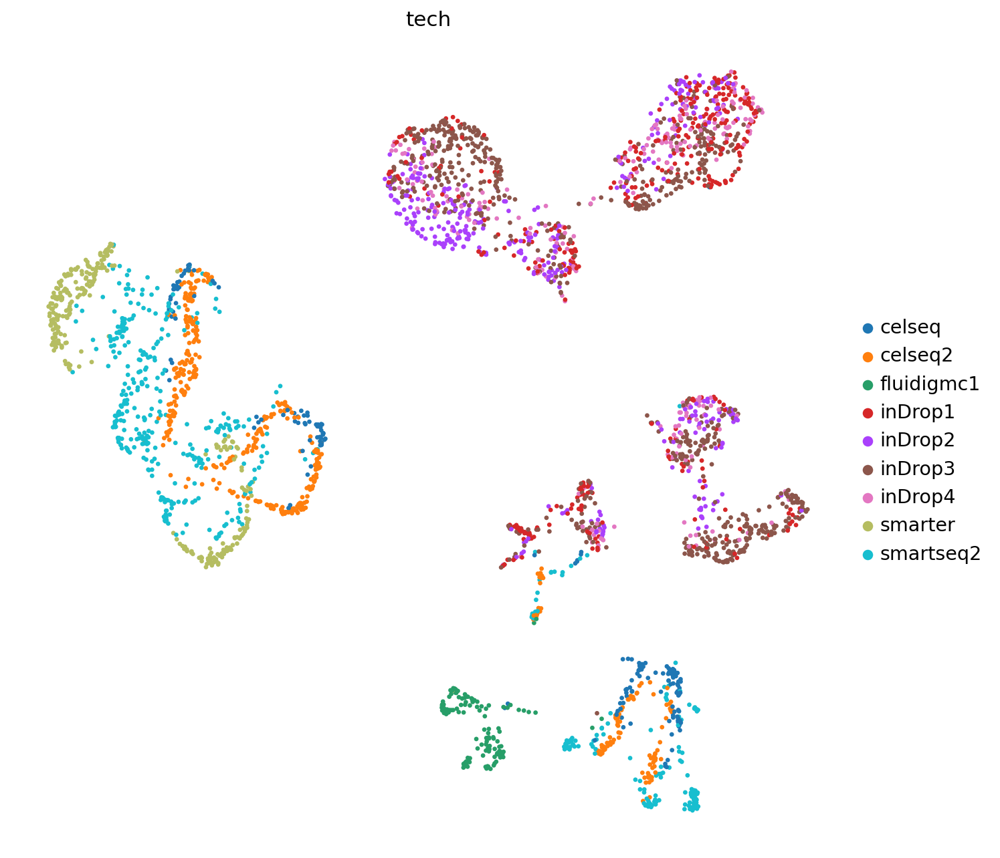

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/50:   2%|▏         | 1/50 [00:00<00:26,  1.88it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.53e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/50:   4%|▍         | 2/50 [00:01<00:23,  2.02it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.31e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/50:   6%|▌         | 3/50 [00:01<00:22,  2.05it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.25e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/50:   8%|▊         | 4/50 [00:01<00:22,  2.07it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.23e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/50:  10%|█         | 5/50 [00:02<00:21,  2.08it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.22e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/50:  12%|█▏        | 6/50 [00:02<00:20,  2.10it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/50:  14%|█▍        | 7/50 [00:03<00:20,  2.10it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/50:  16%|█▌        | 8/50 [00:03<00:19,  2.11it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/50:  18%|█▊        | 9/50 [00:04<00:19,  2.10it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/50:  20%|██        | 10/50 [00:04<00:18,  2.11it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/50:  22%|██▏       | 11/50 [00:05<00:19,  2.05it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/50:  24%|██▍       | 12/50 [00:05<00:19,  1.97it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/50:  26%|██▌       | 13/50 [00:06<00:19,  1.94it/s, v_num=1, train_loss_step=1.44e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/50:  28%|██▊       | 14/50 [00:06<00:18,  1.90it/s, v_num=1, train_loss_step=1.4e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/50:  30%|███       | 15/50 [00:07<00:18,  1.86it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/50:  32%|███▏      | 16/50 [00:08<00:17,  1.91it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/50:  34%|███▍      | 17/50 [00:08<00:17,  1.93it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/50:  36%|███▌      | 18/50 [00:09<00:16,  1.97it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/50:  38%|███▊      | 19/50 [00:09<00:15,  2.00it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 21/50:  40%|████      | 20/50 [00:09<00:14,  2.02it/s, v_num=1, train_loss_step=11504.0, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 22/50:  42%|████▏     | 21/50 [00:10<00:14,  2.04it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 23/50:  44%|████▍     | 22/50 [00:10<00:13,  2.07it/s, v_num=1, train_loss_step=9.37e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 24/50:  46%|████▌     | 23/50 [00:11<00:12,  2.09it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 25/50:  48%|████▊     | 24/50 [00:11<00:12,  2.08it/s, v_num=1, train_loss_step=9.56e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 26/50:  50%|█████     | 25/50 [00:12<00:12,  2.07it/s, v_num=1, train_loss_step=9.21e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 27/50:  52%|█████▏    | 26/50 [00:12<00:11,  2.05it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 28/50:  54%|█████▍    | 27/50 [00:13<00:11,  2.07it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 29/50:  56%|█████▌    | 28/50 [00:13<00:10,  2.09it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 30/50:  58%|█████▊    | 29/50 [00:14<00:10,  2.09it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 31/50:  60%|██████    | 30/50 [00:14<00:09,  2.06it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 32/50:  62%|██████▏   | 31/50 [00:15<00:09,  2.08it/s, v_num=1, train_loss_step=9.04e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 33/50:  64%|██████▍   | 32/50 [00:15<00:08,  2.08it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 34/50:  66%|██████▌   | 33/50 [00:16<00:08,  2.07it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 35/50:  68%|██████▊   | 34/50 [00:16<00:07,  2.09it/s, v_num=1, train_loss_step=1.29e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 36/50:  70%|███████   | 35/50 [00:17<00:07,  2.10it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 37/50:  72%|███████▏  | 36/50 [00:17<00:06,  2.03it/s, v_num=1, train_loss_step=1.57e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 38/50:  74%|███████▍  | 37/50 [00:18<00:06,  1.98it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 39/50:  76%|███████▌  | 38/50 [00:18<00:06,  1.91it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 40/50:  78%|███████▊  | 39/50 [00:19<00:05,  1.84it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 41/50:  80%|████████  | 40/50 [00:19<00:05,  1.84it/s, v_num=1, train_loss_step=1.34e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 42/50:  82%|████████▏ | 41/50 [00:20<00:04,  1.93it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 43/50:  84%|████████▍ | 42/50 [00:20<00:04,  1.99it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 44/50:  86%|████████▌ | 43/50 [00:21<00:03,  2.03it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 45/50:  88%|████████▊ | 44/50 [00:21<00:02,  2.05it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 46/50:  90%|█████████ | 45/50 [00:22<00:02,  2.07it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 47/50:  92%|█████████▏| 46/50 [00:22<00:01,  2.06it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 48/50:  94%|█████████▍| 47/50 [00:23<00:01,  2.08it/s, v_num=1, train_loss_step=9.21e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 49/50:  96%|█████████▌| 48/50 [00:23<00:00,  2.09it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50:  98%|█████████▊| 49/50 [00:24<00:00,  2.09it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.09it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.13e+4]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.03it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.13e+4]


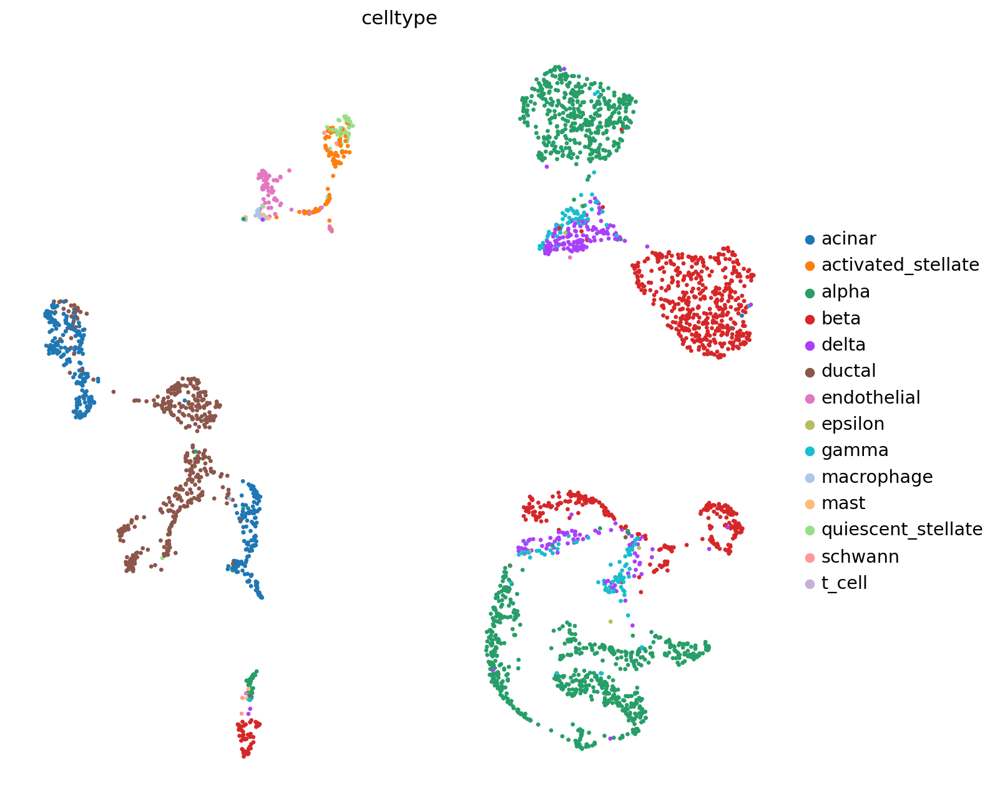

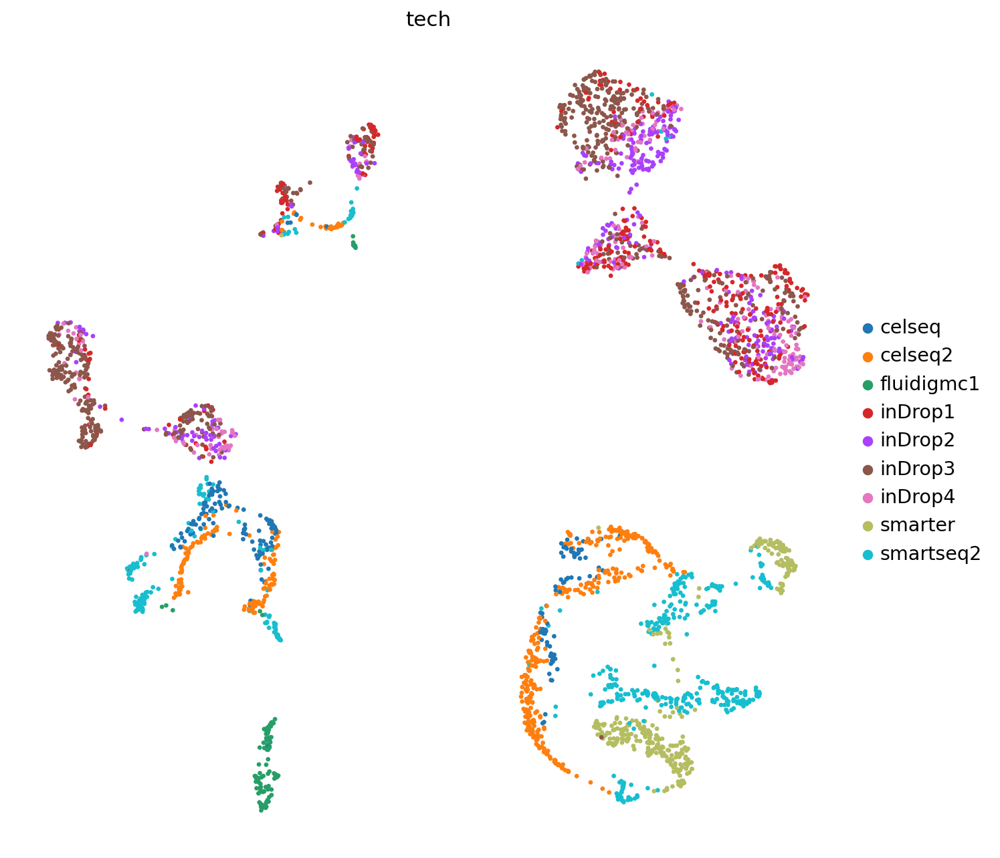

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/50:   2%|▏         | 1/50 [00:00<00:26,  1.87it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/50:   4%|▍         | 2/50 [00:01<00:24,  1.97it/s, v_num=1, train_loss_step=9.75e+3, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/50:   6%|▌         | 3/50 [00:01<00:22,  2.05it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/50:   8%|▊         | 4/50 [00:01<00:22,  2.07it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/50:  10%|█         | 5/50 [00:02<00:21,  2.08it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/50:  12%|█▏        | 6/50 [00:02<00:21,  2.09it/s, v_num=1, train_loss_step=1.32e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/50:  14%|█▍        | 7/50 [00:03<00:20,  2.10it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/50:  16%|█▌        | 8/50 [00:03<00:20,  2.09it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/50:  18%|█▊        | 9/50 [00:04<00:19,  2.07it/s, v_num=1, train_loss_step=1.24e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/50:  20%|██        | 10/50 [00:04<00:19,  2.09it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/50:  22%|██▏       | 11/50 [00:05<00:18,  2.10it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/50:  24%|██▍       | 12/50 [00:05<00:18,  2.11it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/50:  26%|██▌       | 13/50 [00:06<00:17,  2.09it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/50:  28%|██▊       | 14/50 [00:06<00:17,  2.10it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/50:  30%|███       | 15/50 [00:07<00:16,  2.11it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/50:  32%|███▏      | 16/50 [00:07<00:16,  2.12it/s, v_num=1, train_loss_step=9.9e+3, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/50:  34%|███▍      | 17/50 [00:08<00:15,  2.11it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/50:  36%|███▌      | 18/50 [00:08<00:15,  2.08it/s, v_num=1, train_loss_step=1.38e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/50:  38%|███▊      | 19/50 [00:09<00:15,  1.95it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 21/50:  40%|████      | 20/50 [00:09<00:15,  1.95it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 22/50:  42%|████▏     | 21/50 [00:10<00:15,  1.89it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 23/50:  44%|████▍     | 22/50 [00:10<00:14,  1.87it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 24/50:  46%|████▌     | 23/50 [00:11<00:14,  1.87it/s, v_num=1, train_loss_step=1.17e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 25/50:  48%|████▊     | 24/50 [00:11<00:13,  1.95it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 26/50:  50%|█████     | 25/50 [00:12<00:12,  2.00it/s, v_num=1, train_loss_step=1.03e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 27/50:  52%|█████▏    | 26/50 [00:12<00:11,  2.04it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 28/50:  54%|█████▍    | 27/50 [00:13<00:11,  2.07it/s, v_num=1, train_loss_step=1.45e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 29/50:  56%|█████▌    | 28/50 [00:13<00:10,  2.07it/s, v_num=1, train_loss_step=1.18e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 30/50:  58%|█████▊    | 29/50 [00:14<00:10,  2.10it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 31/50:  60%|██████    | 30/50 [00:14<00:09,  2.11it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 32/50:  62%|██████▏   | 31/50 [00:15<00:09,  2.11it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 33/50:  64%|██████▍   | 32/50 [00:15<00:08,  2.11it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 34/50:  66%|██████▌   | 33/50 [00:16<00:08,  2.12it/s, v_num=1, train_loss_step=9.78e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 35/50:  68%|██████▊   | 34/50 [00:16<00:07,  2.10it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 36/50:  70%|███████   | 35/50 [00:17<00:07,  2.10it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 37/50:  72%|███████▏  | 36/50 [00:17<00:06,  2.10it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 38/50:  74%|███████▍  | 37/50 [00:17<00:06,  2.11it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 39/50:  76%|███████▌  | 38/50 [00:18<00:05,  2.11it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 40/50:  78%|███████▊  | 39/50 [00:18<00:05,  2.12it/s, v_num=1, train_loss_step=9.99e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 41/50:  80%|████████  | 40/50 [00:19<00:04,  2.11it/s, v_num=1, train_loss_step=8.92e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 42/50:  82%|████████▏ | 41/50 [00:19<00:04,  2.09it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 43/50:  84%|████████▍ | 42/50 [00:20<00:03,  2.09it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 44/50:  86%|████████▌ | 43/50 [00:20<00:03,  2.09it/s, v_num=1, train_loss_step=7.98e+3, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 45/50:  88%|████████▊ | 44/50 [00:21<00:02,  2.06it/s, v_num=1, train_loss_step=1.26e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 46/50:  90%|█████████ | 45/50 [00:21<00:02,  1.99it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 47/50:  92%|█████████▏| 46/50 [00:22<00:02,  1.98it/s, v_num=1, train_loss_step=1.49e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 48/50:  94%|█████████▍| 47/50 [00:22<00:01,  1.93it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 49/50:  96%|█████████▌| 48/50 [00:23<00:01,  1.84it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50:  98%|█████████▊| 49/50 [00:24<00:00,  1.90it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  1.96it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.04it/s, v_num=1, train_loss_step=1.08e+4, train_loss_epoch=1.12e+4]


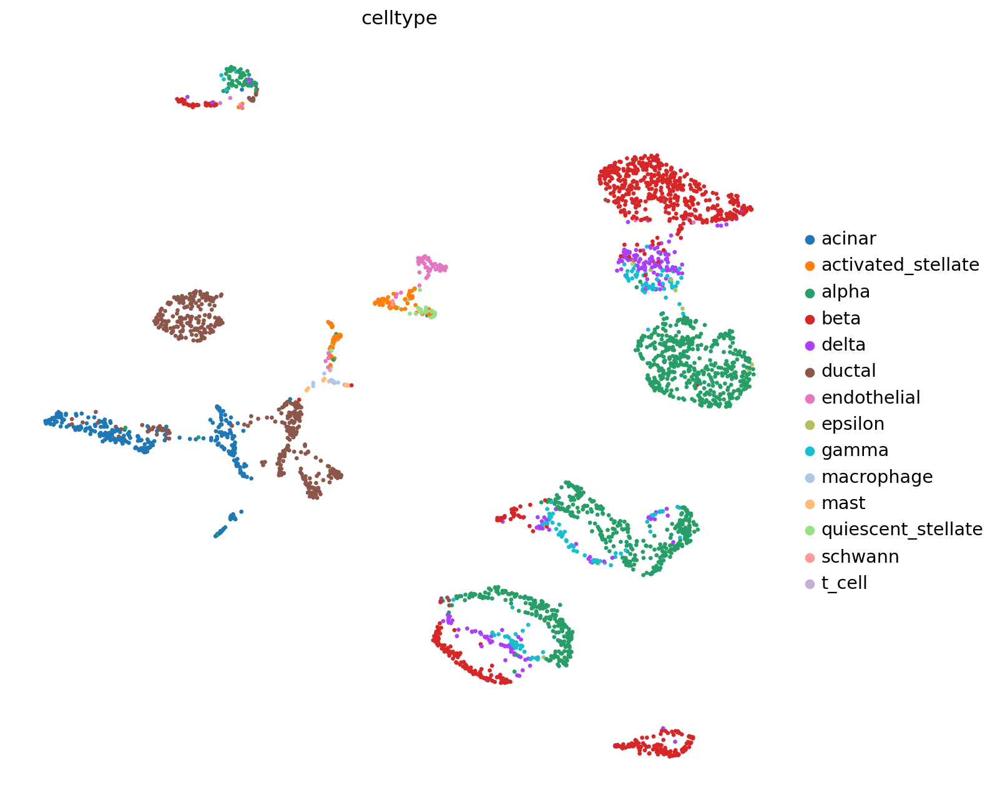

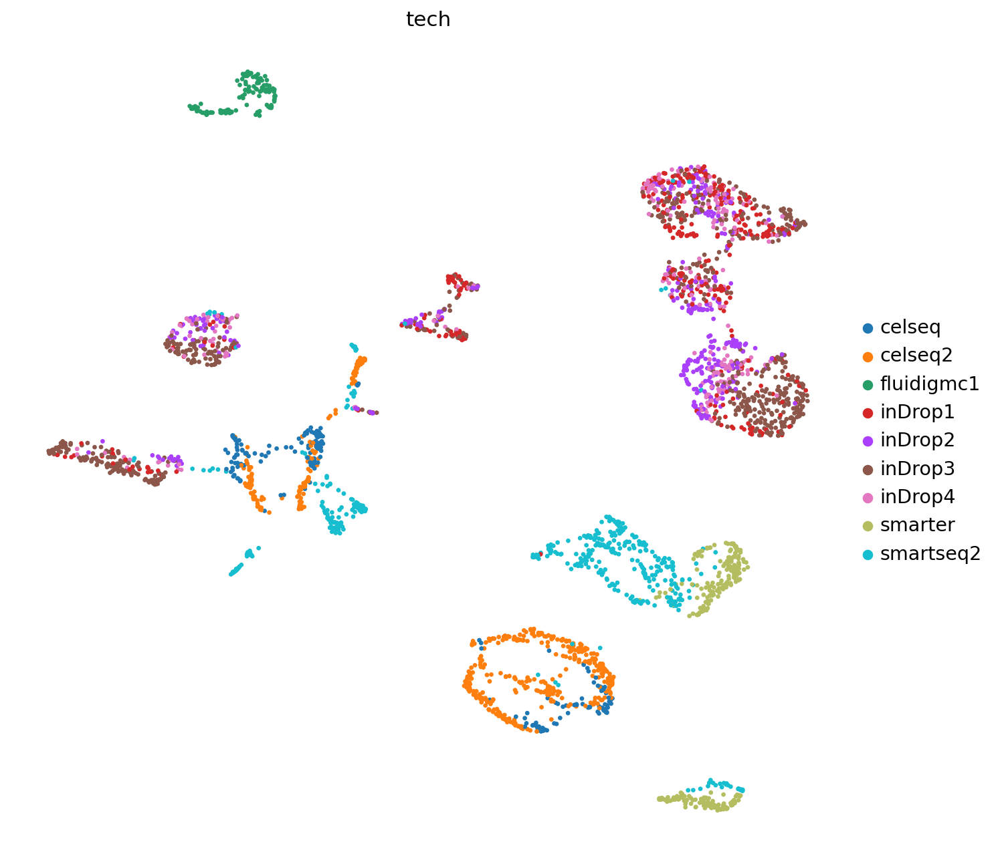

/usr/local/lib/python3.10/dist-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 2/50:   2%|▏         | 1/50 [00:00<00:27,  1.76it/s, v_num=1, train_loss_step=1.5e+4, train_loss_epoch=1.52e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 3/50:   4%|▍         | 2/50 [00:01<00:25,  1.92it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.3e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 4/50:   6%|▌         | 3/50 [00:01<00:25,  1.86it/s, v_num=1, train_loss_step=1.23e+4, train_loss_epoch=1.24e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 5/50:   8%|▊         | 4/50 [00:02<00:24,  1.85it/s, v_num=1, train_loss_step=1.22e+4, train_loss_epoch=1.21e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 6/50:  10%|█         | 5/50 [00:02<00:24,  1.83it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.2e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 7/50:  12%|█▏        | 6/50 [00:03<00:24,  1.79it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 8/50:  14%|█▍        | 7/50 [00:03<00:24,  1.75it/s, v_num=1, train_loss_step=1.67e+4, train_loss_epoch=1.19e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 9/50:  16%|█▌        | 8/50 [00:04<00:22,  1.84it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 10/50:  18%|█▊        | 9/50 [00:04<00:21,  1.88it/s, v_num=1, train_loss_step=1.15e+4, train_loss_epoch=1.18e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 11/50:  20%|██        | 10/50 [00:05<00:20,  1.94it/s, v_num=1, train_loss_step=1.14e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 12/50:  22%|██▏       | 11/50 [00:05<00:19,  1.98it/s, v_num=1, train_loss_step=9.96e+3, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 13/50:  24%|██▍       | 12/50 [00:06<00:18,  2.02it/s, v_num=1, train_loss_step=1.19e+4, train_loss_epoch=1.17e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 14/50:  26%|██▌       | 13/50 [00:06<00:18,  2.03it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 15/50:  28%|██▊       | 14/50 [00:07<00:17,  2.04it/s, v_num=1, train_loss_step=9.89e+3, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 16/50:  30%|███       | 15/50 [00:07<00:17,  2.05it/s, v_num=1, train_loss_step=1.28e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 17/50:  32%|███▏      | 16/50 [00:08<00:16,  2.05it/s, v_num=1, train_loss_step=1.33e+4, train_loss_epoch=1.16e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 18/50:  34%|███▍      | 17/50 [00:08<00:15,  2.07it/s, v_num=1, train_loss_step=1.11e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 19/50:  36%|███▌      | 18/50 [00:09<00:15,  2.07it/s, v_num=1, train_loss_step=1e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 20/50:  38%|███▊      | 19/50 [00:09<00:14,  2.07it/s, v_num=1, train_loss_step=1.13e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 21/50:  40%|████      | 20/50 [00:10<00:14,  2.04it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 22/50:  42%|████▏     | 21/50 [00:10<00:14,  2.04it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.15e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 23/50:  44%|████▍     | 22/50 [00:11<00:13,  2.04it/s, v_num=1, train_loss_step=1.04e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 24/50:  46%|████▌     | 23/50 [00:11<00:13,  2.06it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 25/50:  48%|████▊     | 24/50 [00:12<00:12,  2.06it/s, v_num=1, train_loss_step=1.42e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 26/50:  50%|█████     | 25/50 [00:12<00:12,  2.07it/s, v_num=1, train_loss_step=1.16e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 27/50:  52%|█████▏    | 26/50 [00:13<00:11,  2.07it/s, v_num=1, train_loss_step=1.2e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 28/50:  54%|█████▍    | 27/50 [00:13<00:11,  2.08it/s, v_num=1, train_loss_step=9.49e+3, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 29/50:  56%|█████▌    | 28/50 [00:14<00:10,  2.03it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 30/50:  58%|█████▊    | 29/50 [00:14<00:10,  2.00it/s, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 31/50:  60%|██████    | 30/50 [00:15<00:10,  1.98it/s, v_num=1, train_loss_step=1.06e+4, train_loss_epoch=1.14e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 32/50:  62%|██████▏   | 31/50 [00:15<00:09,  1.92it/s, v_num=1, train_loss_step=9.38e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 33/50:  64%|██████▍   | 32/50 [00:16<00:09,  1.85it/s, v_num=1, train_loss_step=8.98e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 34/50:  66%|██████▌   | 33/50 [00:16<00:09,  1.89it/s, v_num=1, train_loss_step=1.07e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 35/50:  68%|██████▊   | 34/50 [00:17<00:08,  1.94it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 36/50:  70%|███████   | 35/50 [00:17<00:07,  1.98it/s, v_num=1, train_loss_step=1.25e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 37/50:  72%|███████▏  | 36/50 [00:18<00:06,  2.00it/s, v_num=1, train_loss_step=1.55e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 38/50:  74%|███████▍  | 37/50 [00:18<00:06,  2.04it/s, v_num=1, train_loss_step=1.37e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 39/50:  76%|███████▌  | 38/50 [00:19<00:05,  2.06it/s, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 40/50:  78%|███████▊  | 39/50 [00:19<00:05,  2.07it/s, v_num=1, train_loss_step=1.02e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 41/50:  80%|████████  | 40/50 [00:20<00:04,  2.08it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 42/50:  82%|████████▏ | 41/50 [00:20<00:04,  2.06it/s, v_num=1, train_loss_step=1.36e+4, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 43/50:  84%|████████▍ | 42/50 [00:21<00:03,  2.08it/s, v_num=1, train_loss_step=9.47e+3, train_loss_epoch=1.13e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 44/50:  86%|████████▌ | 43/50 [00:21<00:03,  2.07it/s, v_num=1, train_loss_step=1.01e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 45/50:  88%|████████▊ | 44/50 [00:22<00:02,  2.06it/s, v_num=1, train_loss_step=1.39e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 46/50:  90%|█████████ | 45/50 [00:22<00:02,  2.03it/s, v_num=1, train_loss_step=1.21e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 47/50:  92%|█████████▏| 46/50 [00:23<00:01,  2.04it/s, v_num=1, train_loss_step=1.3e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 48/50:  94%|█████████▍| 47/50 [00:23<00:01,  2.05it/s, v_num=1, train_loss_step=1.35e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 49/50:  96%|█████████▌| 48/50 [00:24<00:00,  2.06it/s, v_num=1, train_loss_step=1.1e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50:  98%|█████████▊| 49/50 [00:24<00:00,  2.06it/s, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.12e+4]

/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)
/usr/local/lib/python3.10/dist-packages/scvi/module/_vae.py:458: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs["px"].log_prob(x).sum(-1)


Epoch 50/50: 100%|██████████| 50/50 [00:24<00:00,  2.07it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:25<00:00,  2.00it/s, v_num=1, train_loss_step=1.05e+4, train_loss_epoch=1.12e+4]


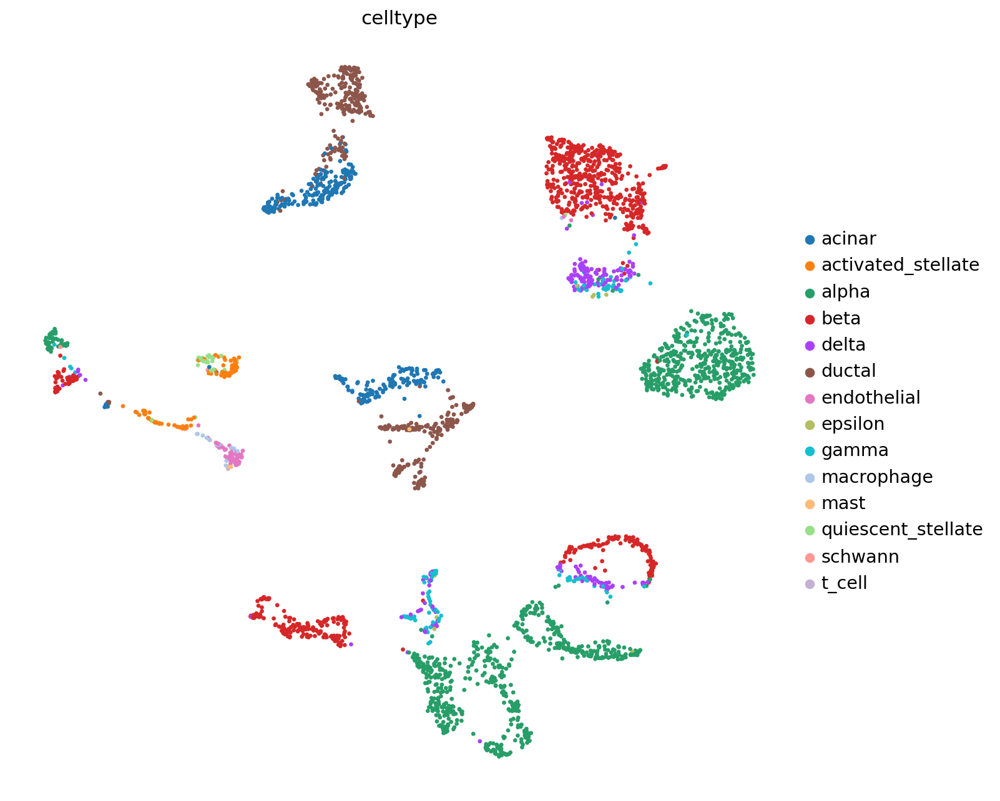

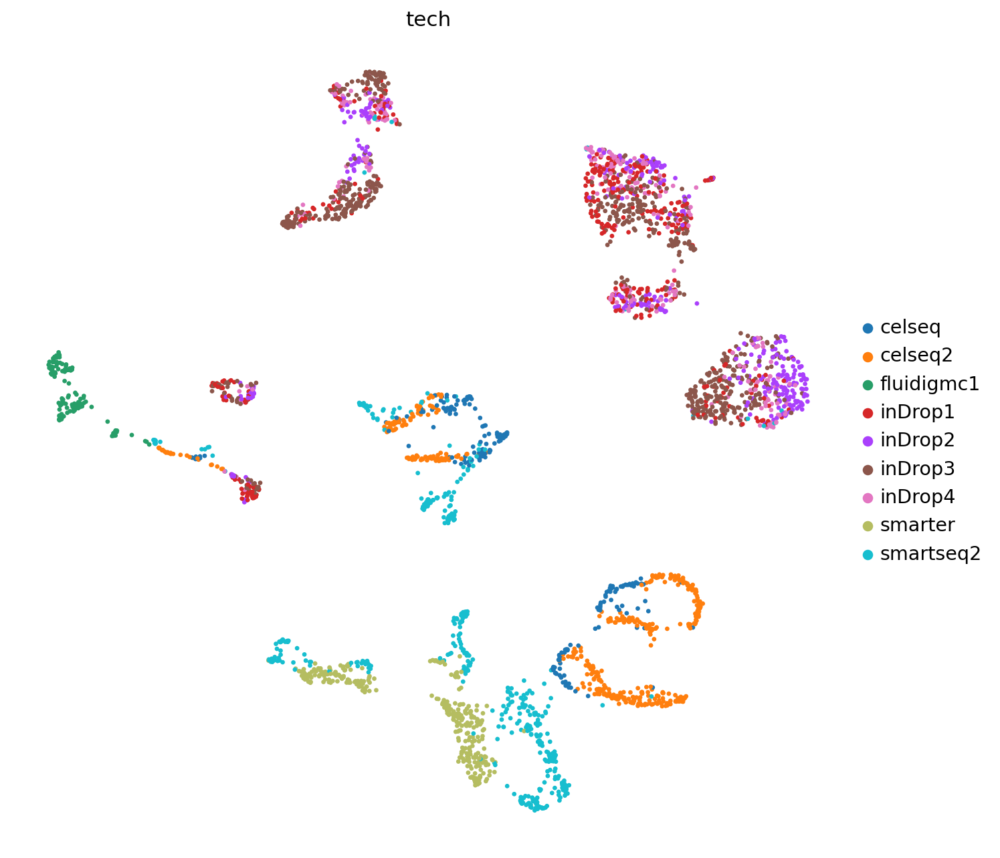

In [ ]:
sc.settings.verbosity = 0
for i in range(num_clients):
  scvi.model.SCVI.setup_anndata(
      groups[i],
      layer="counts",
      categorical_covariate_keys=["tech"],
  )

  model = scvi.model.SCVI(groups[i])
  model.train(max_epochs=50)
  latent = model.get_latent_representation()
  np.save(f'latent_scVI_{i}', latent)
  groups[i].obsm["X_scVI"] = latent

  sc.pp.neighbors(groups[i], use_rep="X_scVI")
  sc.tl.umap(groups[i], min_dist=0.3)

  sc.pl.umap(
      groups[i],
      color=["celltype"],
      frameon=False,
      save=f'{i}_celltype_scVI.pdf'
  )
  sc.pl.umap(
      groups[i],
      color=["tech"],
      frameon=False,
      save=f'{i}_tech_scVI.pdf'
  )

In [ ]:
for i in range(num_clients):
  latent = np.load(f'/content/latent_scFedVI_{i}.npy')
  np.savetxt(f'latent_scFedVI_{i}.csv', latent, delimiter=",")

for i in range(num_clients):
  latent = np.load(f'/content/latent_scVI_{i}.npy')
  np.savetxt(f'latent_scVI_{i}.csv', latent, delimiter=",")